In [13]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential, layers
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from tqdm import tqdm
import numpy as np
from PIL import Image

import matplotlib.pyplot as plt

import os

In [16]:
# data_path = './raw_data/train_data/' discogs_images
data_path = './raw_data/train_data/'

classes = {'Anri (2) - Bi・Ki・Ni':0,  
            'Anri (2) - Coool':1,  
            'Anri (2) - Timely!!':2,  
            'Anri (2) - Wave':3,  
            'Hiroshi Sato - Aqua':4,  
            'Hiroshi Sato - Awakening':5,  
            'Hiroshi Sato - Future File':6,  
            'Hiroshi Sato - Sound Of Science':7,  
            'Mariya Takeuchi - Beginning':8,  
            'Mariya Takeuchi - Love Songs':9,  
            'Mariya Takeuchi - Miss M':10,  
            'Mariya Takeuchi - Request':11,  
            'Mariya Takeuchi - Trad = トラッド':12,  
            'Mariya Takeuchi - University Street':13,  
            'Momoko Kikuchi - Adventure':14,  
            'Momoko Kikuchi - Escape From Dimension':15,  
            'Momoko Kikuchi - Ocean Side':16,  
            'Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線':17,  
            'Taeko Ohnuki - Aventure':18,  
            'Taeko Ohnuki - Cliché':19,  
            'Taeko Ohnuki - Grey Skies':20,  
            'Taeko Ohnuki - Mignonne':21,  
            'Taeko Ohnuki - Romantique':22,  
            'Taeko Ohnuki - Sunshower':23,  
            'Tatsuro Yamashita - Big Wave = ビッグウェイブ':24,  
            'Tatsuro Yamashita - Circus Town':25,  
            'Tatsuro Yamashita - For You':26,  
            'Tatsuro Yamashita - Go Ahead!':27,  
            "Tatsuro Yamashita - It's A Poppin' Time":28,  
            'Tatsuro Yamashita - Melodies':29,  
            'Tatsuro Yamashita - Moonglow':30,  
            'Tatsuro Yamashita - On The Street Corner':31,  
            'Tatsuro Yamashita - On The Street Corner 2':32,  
            'Tatsuro Yamashita - Ride On Time':33,  
            'Tatsuro Yamashita - Softly':34,  
            'Tatsuro Yamashita - Spacy':35,  
            'Utada Hikaru - Badモード':36,  
            'Utada Hikaru - Deep River':37,  
            'Utada Hikaru - First Love':38}

imgs = []
labels = []
for (cl, i) in classes.items():
    images_path = [elt for elt in os.listdir(os.path.join(data_path, cl)) if elt.find('.jpg')>0]
    for img in tqdm(images_path[:300]):
        path = os.path.join(data_path, cl, img)
        if os.path.exists(path):
            image = Image.open(path)
            image = image.resize((256, 256))
            imgs.append(np.array(image))
            labels.append(i)

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 186.06it/s]


In [18]:
X = np.array(imgs)
num_classes = len(set(labels))
y = to_categorical(labels, num_classes)

# Finally we shuffle:
p = np.random.permutation(len(X))
X, y = X[p], y[p]

first_split = int(len(imgs) /6.)
second_split = first_split + int(len(imgs) * 0.2)
X_test, X_val, X_train = X[:first_split], X[first_split:second_split], X[second_split:]
y_test, y_val, y_train = y[:first_split], y[first_split:second_split], y[second_split:]

In [22]:
from tensorflow.keras import Sequential, layers
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

def load_own_model():

    model = Sequential()
    model.add(Rescaling(1./255, input_shape=(256,256,3)))

    model.add(layers.Conv2D(16, kernel_size=10, activation='relu'))
    model.add(layers.MaxPooling2D(3))
    
    model.add(layers.Conv2D(32, kernel_size=8, activation="relu"))
    model.add(layers.MaxPooling2D(3))

    model.add(layers.Conv2D(32, kernel_size=6, activation="relu"))
    model.add(layers.MaxPooling2D(3))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(100, activation='relu'))
    model.add(layers.Dense(39, activation='softmax'))
    
    opt = optimizers.Adam(learning_rate=1e-4)
    model.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])
    
    return model

In [23]:
model_homemade = load_own_model()
model_homemade.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 247, 247, 16)      4816      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 82, 82, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 75, 75, 32)        32800     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 25, 25, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 20, 20, 32)       

In [25]:
es = EarlyStopping(monitor = 'val_accuracy', 
                   mode = 'max', 
                   patience = 5, 
                   verbose = 1, 
                   restore_best_weights = True)

history = model_homemade.fit(X_train, y_train,
                             validation_data = (X_val, y_val),
                             batch_size = 16, 
                             epochs = 20, 
                             callbacks=[es])

Epoch 1/20
12/12 [==============================] - 5s 368ms/step - loss: 3.3869 - accuracy: 0.1685 - val_loss: 3.3906 - val_accuracy: 0.2143
Epoch 2/20
12/12 [==============================] - 4s 334ms/step - loss: 3.2305 - accuracy: 0.2303 - val_loss: 3.2212 - val_accuracy: 0.2500
Epoch 3/20
12/12 [==============================] - 4s 367ms/step - loss: 3.0136 - accuracy: 0.3146 - val_loss: 3.0399 - val_accuracy: 0.3036
Epoch 4/20
12/12 [==============================] - 5s 438ms/step - loss: 2.7158 - accuracy: 0.3371 - val_loss: 2.7755 - val_accuracy: 0.3393
Epoch 5/20
12/12 [==============================] - 5s 416ms/step - loss: 2.4169 - accuracy: 0.3876 - val_loss: 2.5709 - val_accuracy: 0.3571
Epoch 6/20
12/12 [==============================] - 6s 529ms/step - loss: 2.1217 - accuracy: 0.4944 - val_loss: 2.1744 - val_accuracy: 0.4464
Epoch 7/20
12/12 [==============================] - 5s 442ms/step - loss: 1.8397 - accuracy: 0.5281 - val_loss: 1.9883 - val_accuracy: 0.4643
Epoch 

In [26]:
res = model_homemade.evaluate(X_test, y_test)
res

2/2 [==============================] - 1s 175ms/step - loss: 0.5103 - accuracy: 0.8696


[0.5102507472038269, 0.8695651888847351]

In [27]:
test_accuracy = res[-1]
print(f"test_accuracy = {round(test_accuracy,2)*100} %")

test_accuracy = 87.0 %


In [36]:
from tensorflow.keras import optimizers

def build_model():
    # $CHALLENGIFY_BEGIN    
    model = load_model()
    model = add_last_layers(model)
    
    opt = optimizers.Adam(learning_rate=1e-4)
    model.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])
    return model
    # $CHALLENGIFY_END

In [41]:
from tensorflow.keras import layers, models

def add_last_layers(model):
    '''Take a pre-trained model, set its parameters as non-trainable, and add additional trainable layers on top'''
    # $CHALLENGIFY_BEGIN
    base_model = set_nontrainable_layers(model)
    flatten_layer = layers.Flatten()
    dense_layer = layers.Dense(500, activation='relu')
    prediction_layer = layers.Dense(39, activation='softmax')
    
    
    model = models.Sequential([
        base_model,
        flatten_layer,
        dense_layer,
        prediction_layer
    ])
    # $CHALLENGIFY_END
    return model

In [42]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    featurewise_center = False,
    featurewise_std_normalization = False,
    rotation_range = 20,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    horizontal_flip = True,
    brightness_range = (0.5, 1.),
    zoom_range = (0.3, 1.5))


# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
datagen.fit(X_train)

model_data_aug = build_model()

train_flow = datagen.flow(X_train, y_train, batch_size=16)
val_flow = datagen.flow(X_val, y_val, batch_size=16)

es = EarlyStopping(monitor = 'val_accuracy', 
                   mode = 'max', 
                   patience = 5, 
                   verbose = 1, 
                   restore_best_weights = True)

history_data_aug = model_data_aug.fit(train_flow,
                                      validation_data = val_flow, 
                                      epochs = 10,
                                      callbacks = [es])

Epoch 1/10
12/12 [==============================] - 106s 9s/step - loss: 15.3753 - accuracy: 0.0562 - val_loss: 11.2254 - val_accuracy: 0.0357
Epoch 2/10
12/12 [==============================] - 86s 7s/step - loss: 7.4775 - accuracy: 0.3258 - val_loss: 6.0537 - val_accuracy: 0.2857
Epoch 3/10
12/12 [==============================] - 84s 8s/step - loss: 4.3592 - accuracy: 0.5056 - val_loss: 3.0960 - val_accuracy: 0.5000
Epoch 4/10
12/12 [==============================] - 92s 8s/step - loss: 2.6604 - accuracy: 0.5955 - val_loss: 3.1394 - val_accuracy: 0.5893
Epoch 5/10
12/12 [==============================] - 81s 7s/step - loss: 1.7557 - accuracy: 0.6685 - val_loss: 2.7940 - val_accuracy: 0.5536
Epoch 6/10
12/12 [==============================] - 85s 7s/step - loss: 1.5337 - accuracy: 0.7247 - val_loss: 2.7720 - val_accuracy: 0.5714
Epoch 7/10
12/12 [==============================] - 82s 7s/step - loss: 1.5714 - accuracy: 0.7978 - val_loss: 2.3809 - val_accuracy: 0.5893
Epoch 8/10
12/12 

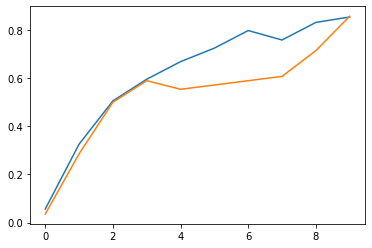

In [43]:
plt.plot(history_data_aug.history['accuracy'])
plt.plot(history_data_aug.history['val_accuracy'])
plt.show()

In [44]:
res_aug = model_data_aug.evaluate(X_test, y_test)

2/2 [==============================] - 22s 6s/step - loss: 0.6192 - accuracy: 0.8913


In [46]:
test_accuracy_aug = res_aug[-1]


print(f"test_accuracy_aug = {round(test_accuracy_aug,2)*100} %")

print(f"test_accuracy = {round(test_accuracy,2)*100} %")

print(f'Chance level: {1./num_classes*100:.1f}%')

test_accuracy_aug = 89.0 %
test_accuracy = 87.0 %
Chance level: 2.6%


In [54]:
model_data_aug.save('model_vynil_Transfer.h5')

In [55]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt

# dimensions of our images
img_width, img_height = 256, 256

# load the model we saved
model = load_model('model_vynil_Transfer.h5')

['m99978540791.jpg', 'm53243629811.jpg', 'm38771948280.jpg', 'm10503854020.jpg', 'm29950335741.jpg', 'm72908875731.jpg', 'm65436610576.jpg', 'm25074840304.jpg', 'm11956445589.jpg', 'm63023392431.jpg', 'm23638748572.jpg', 'm50771184370.jpg', 'm45642271858.jpg', 'm39981932159.jpg', 'm82296285274.jpg', 'm43543676510.jpg', 'm61164432023.jpg', 'm29119208452.jpg', 'm17274960811.jpg', 'm41761078299.jpg', 'm53525627772.jpg', 'm39915736818.jpg', 'm30818047931.jpg', 'm91504947941.jpg', 'm59500847829.jpg', 'm72144546106.jpg', 'm49377627992.jpg', 'm79853025927.jpg', 'm95634696809.jpg', 'm65154901895.jpg', 'm80355291173.jpg', 'm42821800291.jpg', 'm75701026077.jpg', 'm99098637207.jpg', 'm19509388989.jpg', 'm10012187550.jpg', 'm96578429957.jpg', 'm18720760061.jpg', 'm31052956154.jpg', 'm12020166923.jpg', 'm16845919052.jpg', 'm38850206522.jpg', 'm70387931244.jpg', 'm62966640085.jpg', 'm36345618234.jpg', 'm18466188311.jpg', 'm64031157958.jpg', 'm51335679249.jpg', 'm46935897438.jpg', 'm61122959523.jpg',

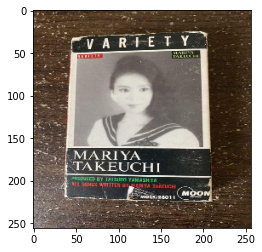

1/1 [==============================] - 0s 440ms/step
[[0.01232623 0.0084942  0.02579893 0.03017845 0.02075738 0.00632168
  0.02959592 0.01200994 0.03839567 0.00496887 0.05380559 0.02896064
  0.01650098 0.00657343 0.02839721 0.02935451 0.02019135 0.04229681
  0.03900989 0.03419953 0.02498834 0.07606354 0.00753203 0.01483664
  0.04240311 0.00895393 0.006682   0.01707515 0.00494379 0.02329162
  0.0292729  0.02246575 0.0654172  0.01865771 0.082478   0.02164944
  0.01521786 0.01934428 0.01058939]]
Tatsuro Yamashita - Softly , 8.25
m99978540791.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m53243629811.jpg


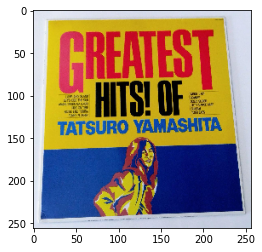

1/1 [==============================] - 0s 322ms/step
[[0.01495869 0.01160697 0.02945973 0.03856213 0.03619715 0.01418514
  0.01483412 0.01215514 0.01711977 0.00682955 0.03628559 0.06108856
  0.01725697 0.00696617 0.02422513 0.03849552 0.03587598 0.036242
  0.03829379 0.0568671  0.01894675 0.0561783  0.00648167 0.01545547
  0.03734968 0.00709834 0.00463044 0.01720002 0.00871002 0.02447756
  0.02512988 0.01224062 0.04220597 0.01678779 0.07321206 0.03839694
  0.02781074 0.01131096 0.00887159]]
Tatsuro Yamashita - Softly , 7.32
m53243629811.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m38771948280.jpg


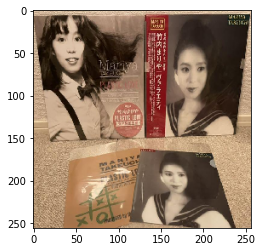

1/1 [==============================] - 0s 403ms/step
[[0.02114351 0.01721559 0.0235032  0.02675813 0.04118158 0.00533592
  0.01854375 0.00610162 0.01312419 0.0054649  0.06010789 0.03515847
  0.02165356 0.02080302 0.05631607 0.05198812 0.0140637  0.03126174
  0.03824781 0.03718499 0.02222359 0.05569334 0.00880318 0.02878799
  0.03197843 0.00810671 0.00522439 0.01539733 0.00732401 0.02219192
  0.01778932 0.02777791 0.02252679 0.02568808 0.04767257 0.03627622
  0.03558671 0.02662534 0.00916837]]
Mariya Takeuchi - Miss M , 6.01
m38771948280.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m10503854020.jpg


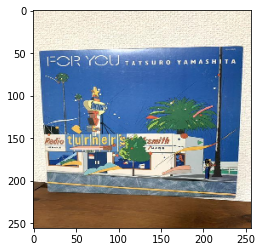

1/1 [==============================] - 0s 283ms/step
[[0.01483828 0.00887115 0.03155373 0.05386234 0.02304542 0.00393824
  0.0219478  0.00633487 0.01970917 0.00470342 0.04827186 0.03685993
  0.01977112 0.01056472 0.03136821 0.03571313 0.03069698 0.05694496
  0.0364704  0.0419146  0.02962849 0.06281862 0.00649412 0.0074742
  0.06814031 0.00680209 0.02130082 0.01774345 0.00726419 0.0158907
  0.0216025  0.0090567  0.03985091 0.01722118 0.06736068 0.02173334
  0.02406066 0.01276222 0.0054145 ]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 6.81
m10503854020.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m29950335741.jpg


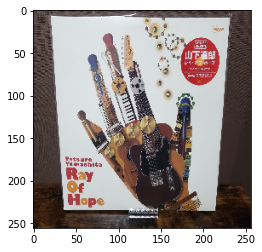

1/1 [==============================] - 0s 325ms/step
[[0.01535931 0.01098257 0.02404366 0.04098234 0.03083543 0.0059204
  0.02487757 0.01383441 0.01301873 0.00534731 0.04646586 0.03311401
  0.02032182 0.00660161 0.01681864 0.03199925 0.01791065 0.05346624
  0.05430944 0.04351735 0.02163978 0.05244572 0.00935169 0.02269552
  0.05069681 0.01030296 0.00705042 0.01554147 0.0051766  0.03083608
  0.03104852 0.01507745 0.05307799 0.02192538 0.08013774 0.01739791
  0.01640547 0.01620827 0.01325762]]
Tatsuro Yamashita - Softly , 8.01
m29950335741.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m72908875731.jpg


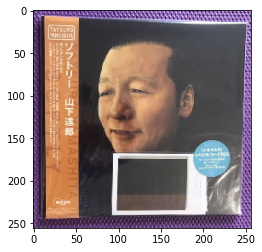

1/1 [==============================] - 0s 297ms/step
[[0.01641613 0.01132085 0.02508894 0.03564791 0.03846695 0.00859444
  0.02091934 0.00799447 0.01761974 0.00853431 0.04299346 0.03833989
  0.02234367 0.01365727 0.05130078 0.03439674 0.01469619 0.0326436
  0.02606067 0.04716797 0.01472608 0.05440513 0.00915467 0.01558494
  0.0224648  0.00958892 0.00707945 0.01045568 0.00460385 0.02064507
  0.02129834 0.00913177 0.04251309 0.02680229 0.12804602 0.03060259
  0.02049076 0.02777043 0.0104327 ]]
Tatsuro Yamashita - Softly , 12.80
m72908875731.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m65436610576.jpg


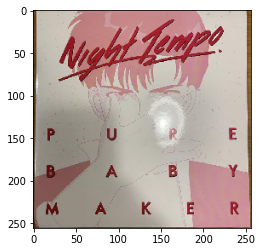

1/1 [==============================] - 0s 294ms/step
[[0.01374663 0.01514452 0.02674276 0.03471178 0.03516306 0.00448769
  0.01689448 0.00853361 0.01153534 0.00703388 0.06480491 0.0448839
  0.01795274 0.0151501  0.02796792 0.02685798 0.03007209 0.03210757
  0.03167216 0.07139488 0.01617512 0.07730075 0.00904008 0.01654017
  0.03080119 0.00655224 0.01450296 0.01885964 0.00613895 0.02819331
  0.01930891 0.01895906 0.03518004 0.03750874 0.04809055 0.03031787
  0.02714557 0.01281293 0.00971391]]
Taeko Ohnuki - Mignonne , 7.73
m65436610576.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m25074840304.jpg


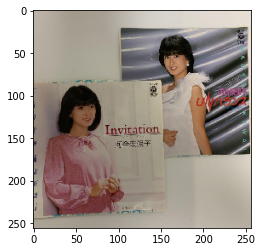

1/1 [==============================] - 0s 394ms/step
[[0.01866658 0.01194037 0.02289675 0.02887142 0.02247479 0.00629318
  0.02487092 0.00963389 0.01506475 0.00401749 0.05465107 0.0517315
  0.01698301 0.02044566 0.04926493 0.04365251 0.02066918 0.01726584
  0.02912796 0.06641804 0.01534282 0.07351035 0.00834637 0.01865563
  0.03632192 0.00943602 0.00687065 0.01631963 0.00563383 0.01969589
  0.0188915  0.0202879  0.05360048 0.02583409 0.05493877 0.02344703
  0.03303807 0.01783139 0.00705782]]
Taeko Ohnuki - Mignonne , 7.35
m25074840304.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m11956445589.jpg


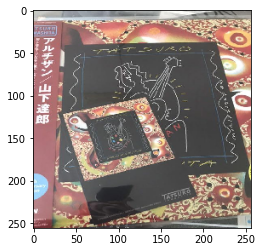

1/1 [==============================] - 0s 318ms/step
[[0.01516365 0.01664101 0.01999032 0.05786977 0.02935539 0.00833798
  0.02453585 0.00742477 0.01559649 0.0061271  0.05361491 0.02060056
  0.02555487 0.01558392 0.02277141 0.04192151 0.02620281 0.0376518
  0.03421677 0.03512138 0.02177662 0.04734048 0.00801298 0.01825976
  0.04578673 0.00851586 0.00810586 0.02483137 0.0075409  0.02079403
  0.02253512 0.02195218 0.06105309 0.01756283 0.05232061 0.02977544
  0.02780722 0.02706508 0.01468157]]
Tatsuro Yamashita - On The Street Corner 2 , 6.11
m11956445589.jpg: Tatsuro Yamashita - On The Street Corner 2
--------------------------------------------------------------
m63023392431.jpg


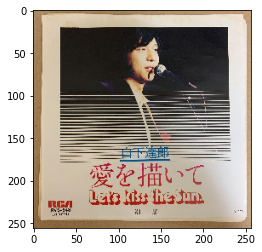

1/1 [==============================] - 0s 298ms/step
[[0.01762223 0.01052745 0.02797074 0.04825044 0.02061746 0.00528215
  0.02095219 0.00949004 0.01677446 0.00564598 0.04652663 0.03113113
  0.02276282 0.01151392 0.02865701 0.04760054 0.02214843 0.02822786
  0.02487743 0.05840923 0.0152909  0.09357513 0.00784212 0.01707672
  0.03922311 0.00676264 0.00870642 0.01424698 0.00434341 0.01799074
  0.02545681 0.01584054 0.04548922 0.02063303 0.09177536 0.02365455
  0.02236514 0.0134033  0.01133571]]
Taeko Ohnuki - Mignonne , 9.36
m63023392431.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m23638748572.jpg


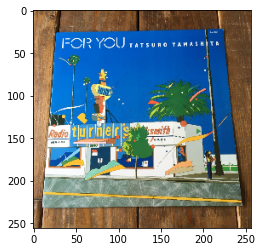

1/1 [==============================] - 0s 299ms/step
[[0.0186277  0.00897009 0.0329545  0.05702327 0.02230298 0.00701796
  0.01813539 0.0060441  0.02755657 0.00584024 0.05914201 0.03884861
  0.02382602 0.0104403  0.01740131 0.04349225 0.02532742 0.06298103
  0.03155027 0.04583225 0.02346495 0.05487082 0.0042577  0.00850592
  0.03179055 0.00576709 0.02303783 0.01440444 0.00640473 0.01512805
  0.03252247 0.01158261 0.0339684  0.01770466 0.09128156 0.02449832
  0.0185505  0.01317502 0.00577006]]
Tatsuro Yamashita - Softly , 9.13
m23638748572.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m50771184370.jpg


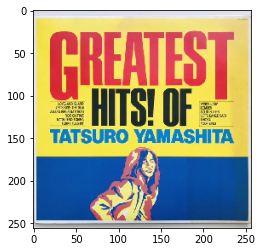

1/1 [==============================] - 0s 242ms/step
[[0.01482751 0.01267884 0.02591688 0.03450581 0.03322588 0.01342293
  0.01710129 0.01172695 0.0164446  0.00732477 0.03708288 0.0587277
  0.01904191 0.0079993  0.02349983 0.05604958 0.03417091 0.04154773
  0.03566151 0.05221405 0.02058037 0.04836121 0.00721339 0.01492684
  0.03651652 0.00628586 0.00650955 0.01816875 0.0087307  0.03375421
  0.03150143 0.01356018 0.03910163 0.01670614 0.05700815 0.03863015
  0.02805606 0.01301045 0.00820744]]
Mariya Takeuchi - Request , 5.87
m50771184370.jpg: Mariya Takeuchi - Request
--------------------------------------------------------------
m45642271858.jpg


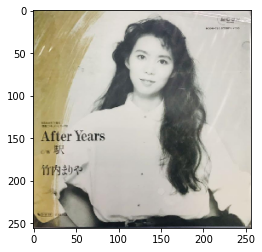

1/1 [==============================] - 0s 293ms/step
[[0.02381846 0.00709152 0.01297026 0.02428902 0.03785491 0.00662727
  0.01492407 0.00632342 0.0145776  0.00676169 0.04967834 0.04920249
  0.03207339 0.01849618 0.06253224 0.05407313 0.0175805  0.01916598
  0.02810153 0.04615701 0.00808798 0.0925379  0.00774469 0.03877753
  0.03880405 0.0069657  0.00424332 0.01290356 0.00225704 0.02114324
  0.01480629 0.01588365 0.02680028 0.0402733  0.05752906 0.02158154
  0.01665483 0.02844829 0.01225876]]
Taeko Ohnuki - Mignonne , 9.25
m45642271858.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m39981932159.jpg


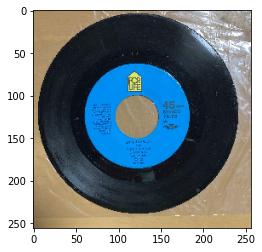

1/1 [==============================] - 0s 233ms/step
[[0.03227883 0.01414851 0.01524819 0.02622423 0.0214068  0.00375954
  0.05050305 0.00636167 0.02785638 0.00708036 0.04662019 0.02796621
  0.0183912  0.02342564 0.03226086 0.03771665 0.01328274 0.02670896
  0.03196731 0.02154537 0.01351643 0.05433987 0.00865975 0.05170069
  0.06854337 0.00844146 0.00981501 0.01984648 0.00571376 0.01960974
  0.03833133 0.01404578 0.03919379 0.01669691 0.06268356 0.0224814
  0.01351822 0.02446068 0.02364907]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 6.85
m39981932159.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m82296285274.jpg


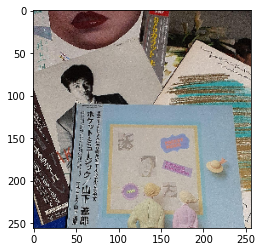

1/1 [==============================] - 0s 287ms/step
[[0.01618342 0.01290749 0.02460156 0.03053057 0.02609211 0.00897289
  0.0266836  0.00762599 0.01691307 0.00388279 0.04057937 0.02274007
  0.01803766 0.018647   0.03847276 0.05453429 0.01469407 0.0251434
  0.03678607 0.0347437  0.01383959 0.09562033 0.00907278 0.02718674
  0.04436713 0.01150305 0.00343688 0.0171409  0.00516883 0.02387551
  0.01639843 0.02284708 0.05566715 0.01964438 0.05479877 0.03870242
  0.03605031 0.01672616 0.00918172]]
Taeko Ohnuki - Mignonne , 9.56
m82296285274.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m43543676510.jpg


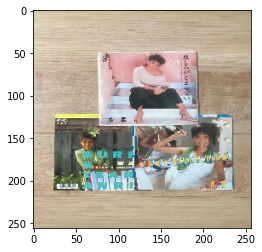

1/1 [==============================] - 0s 251ms/step
[[0.02027852 0.00909013 0.03412408 0.05227885 0.02779563 0.00591619
  0.02357402 0.00704613 0.01196697 0.00582908 0.04978549 0.03031562
  0.02170243 0.0174997  0.03028924 0.05953416 0.03019971 0.04728917
  0.03262464 0.04686861 0.019114   0.05399311 0.00682215 0.01378376
  0.03493601 0.00788612 0.01766926 0.01543428 0.00541877 0.01790933
  0.02537648 0.01967032 0.0391656  0.02346073 0.05843655 0.0341428
  0.02049452 0.0156126  0.00666521]]
Momoko Kikuchi - Escape From Dimension , 5.95
m43543676510.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m61164432023.jpg


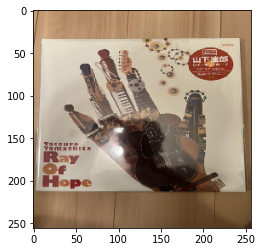

1/1 [==============================] - 0s 315ms/step
[[0.01884231 0.01172917 0.02554069 0.03997746 0.02470472 0.00703032
  0.02528261 0.01004416 0.01806155 0.00564896 0.03442849 0.0501924
  0.03034037 0.01131434 0.02449224 0.04099509 0.01871616 0.06248832
  0.04531024 0.02617666 0.01982644 0.05357907 0.00831244 0.01811179
  0.03820601 0.00881145 0.00999344 0.01781114 0.00614762 0.02351015
  0.02337763 0.01173299 0.04308774 0.02465897 0.09030744 0.01734317
  0.02060756 0.02300526 0.01025339]]
Tatsuro Yamashita - Softly , 9.03
m61164432023.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m29119208452.jpg


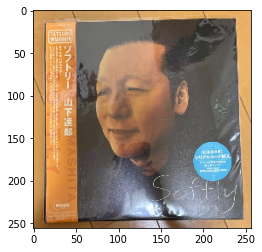

1/1 [==============================] - 0s 284ms/step
[[0.01890252 0.00701193 0.02333185 0.04137805 0.04185626 0.00760409
  0.02164504 0.00771067 0.01299323 0.00569871 0.03423788 0.0427454
  0.03361616 0.0122501  0.03455405 0.04544533 0.01850601 0.02886733
  0.03355561 0.03580407 0.01703642 0.05766478 0.00771344 0.01567117
  0.04420818 0.00810177 0.00394094 0.00900657 0.00336414 0.01284744
  0.01390727 0.0127401  0.03649872 0.02894379 0.13355254 0.03014406
  0.01398894 0.0269836  0.01597189]]
Tatsuro Yamashita - Softly , 13.36
m29119208452.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m17274960811.jpg


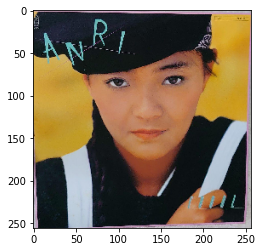

1/1 [==============================] - 0s 287ms/step
[[0.02890647 0.04594489 0.01383912 0.03665846 0.03281198 0.00544344
  0.03063259 0.00547634 0.01488015 0.00745472 0.03814198 0.02862058
  0.0228217  0.01023119 0.03846572 0.0501389  0.02770707 0.03884158
  0.01772656 0.03074104 0.01301763 0.05127097 0.00718904 0.02282332
  0.03686614 0.0079883  0.01262885 0.02276536 0.00748582 0.02879849
  0.02946823 0.0161     0.06373415 0.01806259 0.05501957 0.01819973
  0.01624949 0.03358255 0.01326539]]
Tatsuro Yamashita - On The Street Corner 2 , 6.37
m17274960811.jpg: Tatsuro Yamashita - On The Street Corner 2
--------------------------------------------------------------
m41761078299.jpg


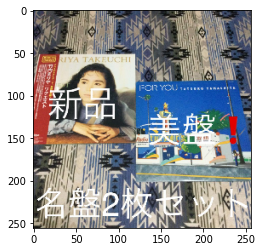

1/1 [==============================] - 0s 280ms/step
[[0.01799133 0.00911694 0.02534415 0.05539807 0.01743582 0.01247172
  0.01467405 0.01075965 0.02130209 0.00607744 0.09957328 0.03444762
  0.0153678  0.01387781 0.03112597 0.057996   0.01280207 0.02889643
  0.03131253 0.04231605 0.01877977 0.0467556  0.00652196 0.01184893
  0.01518163 0.01346252 0.00656163 0.01429773 0.00373746 0.01271239
  0.02992239 0.01461583 0.08036347 0.02201653 0.06277674 0.02568333
  0.02462711 0.02196571 0.0098825 ]]
Mariya Takeuchi - Miss M , 9.96
m41761078299.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m53525627772.jpg


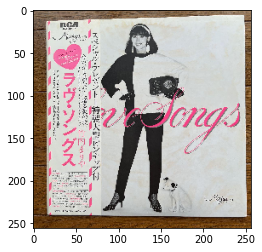

1/1 [==============================] - 0s 309ms/step
[[0.02734391 0.01395649 0.01986216 0.08258201 0.0219445  0.00964981
  0.01981557 0.00692517 0.02022005 0.00839544 0.05230387 0.03183818
  0.02115512 0.0134616  0.01756722 0.04314381 0.0200423  0.02871225
  0.0315488  0.05133992 0.0173195  0.05588947 0.00575092 0.01950471
  0.02570424 0.00657521 0.00865636 0.01481018 0.00412828 0.02202678
  0.02581133 0.01473731 0.04807845 0.01446088 0.10061549 0.02733168
  0.01729372 0.01840261 0.0110946 ]]
Tatsuro Yamashita - Softly , 10.06
m53525627772.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m39915736818.jpg


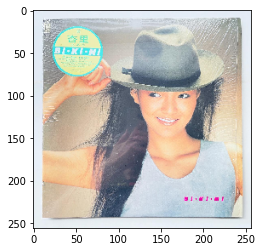

1/1 [==============================] - 0s 275ms/step
[[0.03347796 0.01592583 0.01655296 0.03061767 0.03545617 0.01052744
  0.02433308 0.01072496 0.02389419 0.00628706 0.0440839  0.03686789
  0.02355362 0.01198968 0.03199326 0.04768918 0.01946483 0.02253667
  0.03062567 0.04894631 0.01205886 0.0460048  0.00718031 0.02346193
  0.03124228 0.00795145 0.00702139 0.01429949 0.00605507 0.02230641
  0.03003058 0.02218869 0.05024399 0.01931937 0.06345412 0.03313889
  0.02134475 0.03654824 0.02060102]]
Tatsuro Yamashita - Softly , 6.35
m39915736818.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m30818047931.jpg


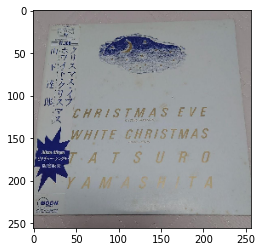

1/1 [==============================] - 0s 314ms/step
[[0.01247321 0.01248839 0.02954065 0.03590199 0.03006919 0.00675931
  0.01650131 0.01156807 0.02478579 0.00776208 0.07199014 0.04257162
  0.02330166 0.01640782 0.03990599 0.03555756 0.02585742 0.04221362
  0.0355483  0.02816723 0.01388489 0.08595861 0.00705795 0.01348237
  0.0358456  0.008229   0.00859432 0.01539568 0.00604928 0.01944423
  0.02001967 0.0212862  0.04502551 0.02711897 0.05656531 0.02593959
  0.02049631 0.01333603 0.00689909]]
Taeko Ohnuki - Mignonne , 8.60
m30818047931.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m91504947941.jpg


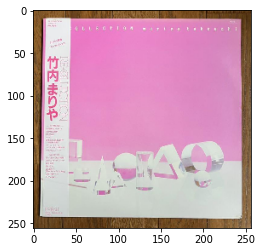

1/1 [==============================] - 0s 298ms/step
[[0.01048749 0.00771043 0.03437202 0.04149158 0.02846031 0.00587343
  0.01888175 0.00848271 0.01675976 0.00491916 0.04857035 0.06114132
  0.02195454 0.0098553  0.03178392 0.05647642 0.03076337 0.05222666
  0.0294204  0.04076337 0.01791415 0.08491628 0.0066477  0.01218116
  0.0400991  0.00597549 0.00619748 0.01028791 0.00785176 0.01999809
  0.02358618 0.01350167 0.02815069 0.02225127 0.07464024 0.02579817
  0.02247447 0.01121665 0.00591732]]
Taeko Ohnuki - Mignonne , 8.49
m91504947941.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m59500847829.jpg


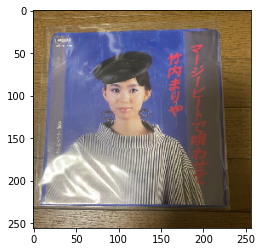

1/1 [==============================] - 0s 275ms/step
[[0.01693654 0.00953748 0.02231876 0.04518718 0.02683168 0.00790668
  0.0182364  0.0069438  0.02236311 0.00676958 0.08642294 0.04169814
  0.02091715 0.01731073 0.04553882 0.05736069 0.01948035 0.05131073
  0.03231464 0.01861877 0.01901071 0.05895207 0.00757655 0.01978088
  0.01931368 0.00917051 0.00643044 0.01477692 0.00681981 0.01640723
  0.03594983 0.01430131 0.03226036 0.01642891 0.08497255 0.02533142
  0.0162127  0.01348489 0.00881504]]
Mariya Takeuchi - Miss M , 8.64
m59500847829.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m72144546106.jpg


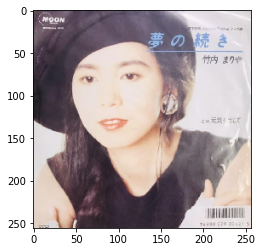

1/1 [==============================] - 0s 283ms/step
[[0.02494016 0.01912304 0.01155398 0.0223615  0.03176052 0.00747447
  0.04520331 0.00680271 0.01552324 0.00740715 0.03462531 0.03547083
  0.04218397 0.01419485 0.04487689 0.05762984 0.01508023 0.01663099
  0.02536736 0.02890035 0.0201558  0.04689508 0.00961567 0.03562767
  0.06274986 0.00506609 0.00696342 0.02136509 0.00404845 0.02210164
  0.02194425 0.01650106 0.03597631 0.02118136 0.06198921 0.01245888
  0.01861648 0.05055111 0.01908194]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 6.27
m72144546106.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m49377627992.jpg


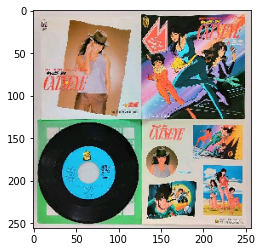

1/1 [==============================] - 0s 269ms/step
[[0.00726418 0.0136869  0.03719274 0.05202661 0.03725673 0.01001644
  0.01940066 0.00759856 0.01766231 0.00587003 0.04659674 0.04629026
  0.01762642 0.01662158 0.01765997 0.02838093 0.01645608 0.04732488
  0.03488719 0.08446611 0.02712453 0.03299071 0.00569004 0.014549
  0.02744144 0.00656401 0.01911215 0.01558323 0.00658295 0.02138269
  0.03373237 0.00679011 0.02045341 0.01055266 0.07474806 0.04903355
  0.03083692 0.02189225 0.01065466]]
Taeko Ohnuki - Cliché , 8.45
m49377627992.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m79853025927.jpg


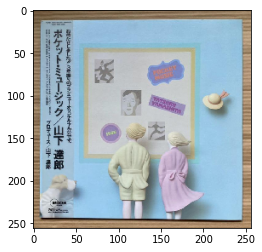

1/1 [==============================] - 0s 274ms/step
[[0.01600906 0.00794266 0.03729448 0.04889115 0.03685005 0.00973545
  0.01881103 0.01204519 0.02898962 0.00814675 0.05405689 0.03882168
  0.02926303 0.00801801 0.02244008 0.03341683 0.02177269 0.03392351
  0.02536843 0.05556262 0.02929064 0.04629978 0.00893464 0.02215344
  0.0360631  0.00847778 0.00853783 0.01469184 0.00456379 0.01811432
  0.02569633 0.01175923 0.03570078 0.03052045 0.07067661 0.0313805
  0.01904084 0.01868769 0.01205118]]
Tatsuro Yamashita - Softly , 7.07
m79853025927.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m95634696809.jpg


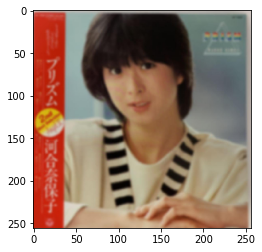

1/1 [==============================] - 0s 272ms/step
[[0.03621708 0.02662012 0.01586056 0.02157809 0.04350083 0.0040746
  0.03530898 0.01054119 0.0155712  0.00876665 0.0326547  0.04541225
  0.02388389 0.01431566 0.03329295 0.0696736  0.01265621 0.01479082
  0.02727728 0.0384362  0.01839519 0.07434671 0.01206801 0.02190997
  0.05028522 0.00713918 0.00601106 0.02068325 0.003462   0.03659661
  0.01400303 0.02064044 0.04330014 0.0146008  0.04378285 0.0163454
  0.01910626 0.03207111 0.01481987]]
Taeko Ohnuki - Mignonne , 7.43
m95634696809.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m65154901895.jpg


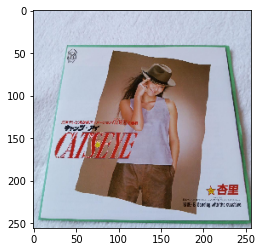

1/1 [==============================] - 0s 329ms/step
[[0.02205981 0.00777471 0.03139576 0.04612654 0.0290533  0.00839581
  0.02679306 0.01064726 0.01894874 0.00649071 0.04728594 0.02968676
  0.02486474 0.00944237 0.02351947 0.06230195 0.01491216 0.02071387
  0.04904202 0.06026052 0.02178817 0.04327377 0.00699171 0.01580732
  0.06078749 0.00784062 0.00776505 0.01307628 0.00596321 0.01421855
  0.02220827 0.01254431 0.03803858 0.02593747 0.08388801 0.02707097
  0.01416175 0.01963438 0.00928868]]
Tatsuro Yamashita - Softly , 8.39
m65154901895.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m80355291173.jpg


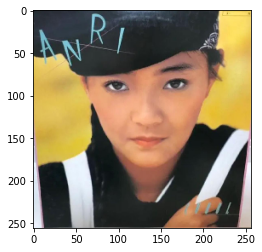

1/1 [==============================] - 0s 304ms/step
[[0.03386072 0.04514655 0.01401337 0.03289773 0.04097255 0.00438737
  0.03144959 0.00434543 0.01313646 0.00721013 0.04277359 0.02607327
  0.02043356 0.01169367 0.04236802 0.04649089 0.02365545 0.02906651
  0.01265553 0.03086301 0.00945835 0.05576224 0.00814877 0.02498173
  0.0329711  0.00682935 0.01305453 0.02189032 0.00785674 0.03279651
  0.0227348  0.01764186 0.05712031 0.02059003 0.05539533 0.0199655
  0.01928283 0.04106062 0.01896569]]
Tatsuro Yamashita - On The Street Corner 2 , 5.71
m80355291173.jpg: Tatsuro Yamashita - On The Street Corner 2
--------------------------------------------------------------
m42821800291.jpg


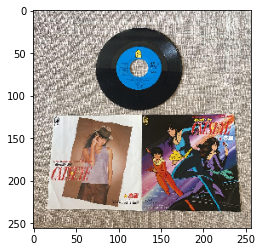

1/1 [==============================] - 0s 287ms/step
[[0.01096713 0.0120081  0.01581376 0.02791057 0.0508468  0.00792094
  0.01755621 0.0096934  0.01831668 0.00676123 0.11576555 0.04132309
  0.02934445 0.00772487 0.03700991 0.04547805 0.01795564 0.02404319
  0.02173216 0.02447905 0.01557344 0.04752374 0.00497368 0.0205972
  0.01883082 0.0067187  0.00455992 0.01387093 0.00489425 0.02106743
  0.02742933 0.01675868 0.04818632 0.01452402 0.10749833 0.02437691
  0.02194124 0.0272541  0.01077021]]
Mariya Takeuchi - Miss M , 11.58
m42821800291.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m75701026077.jpg


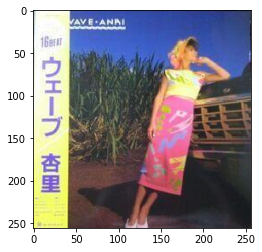

1/1 [==============================] - 0s 319ms/step
[[0.02211272 0.00967266 0.03053097 0.05238361 0.03061205 0.01185614
  0.02352067 0.00626662 0.02216101 0.00518944 0.03195322 0.0407239
  0.02224361 0.01253258 0.03598287 0.05817799 0.02261936 0.03353402
  0.03569682 0.06466446 0.00868022 0.04881061 0.00625448 0.0115804
  0.0359789  0.0110524  0.00685324 0.00938687 0.00673027 0.01286696
  0.01478378 0.01773624 0.04732162 0.03748123 0.07842983 0.02811292
  0.0179727  0.01786251 0.00967014]]
Tatsuro Yamashita - Softly , 7.84
m75701026077.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m99098637207.jpg


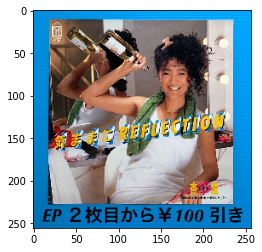

1/1 [==============================] - 0s 259ms/step
[[0.02695684 0.00852007 0.0371412  0.04828525 0.02668266 0.00545513
  0.02649433 0.00862601 0.02264926 0.00976957 0.03164071 0.03780649
  0.02250047 0.01112746 0.02801865 0.04131895 0.01957797 0.03791934
  0.05402725 0.08703018 0.02643507 0.03893813 0.00762321 0.01355168
  0.03576866 0.00694715 0.01485976 0.01837634 0.00259049 0.02818504
  0.02290679 0.01156837 0.02583427 0.01701637 0.06920464 0.0218163
  0.02241129 0.01889004 0.00552862]]
Taeko Ohnuki - Cliché , 8.70
m99098637207.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m19509388989.jpg


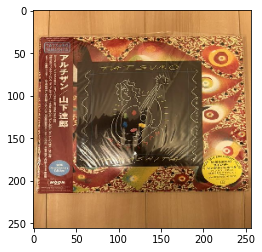

1/1 [==============================] - 0s 274ms/step
[[0.01383221 0.00940544 0.01972479 0.0452137  0.02345008 0.00583818
  0.01710928 0.00723354 0.01892417 0.00465744 0.07187387 0.03883199
  0.03091538 0.01990733 0.03645629 0.03047979 0.0326527  0.0289285
  0.0247562  0.03193563 0.01531529 0.06973324 0.01006505 0.02390243
  0.04437465 0.00824465 0.00565269 0.01501931 0.00477682 0.0118617
  0.02347125 0.01526854 0.03737814 0.03401972 0.08676213 0.0245752
  0.02013764 0.02155361 0.01576133]]
Tatsuro Yamashita - Softly , 8.68
m19509388989.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m10012187550.jpg


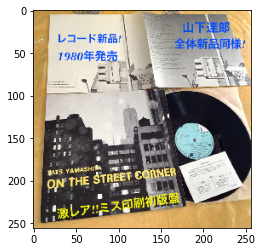

1/1 [==============================] - 0s 274ms/step
[[0.01441342 0.0173267  0.03176407 0.04090102 0.02439851 0.0123233
  0.03311815 0.01578683 0.03364509 0.01178606 0.03599973 0.03802241
  0.02299451 0.0224176  0.03310318 0.02518968 0.02540021 0.03676518
  0.0401533  0.04298399 0.0169524  0.03589237 0.01139373 0.01692257
  0.05041451 0.01177536 0.01830529 0.02648688 0.00903542 0.02033279
  0.02685967 0.01854031 0.0436464  0.01913837 0.05482187 0.02004151
  0.01343917 0.02068513 0.00682333]]
Tatsuro Yamashita - Softly , 5.48
m10012187550.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m96578429957.jpg


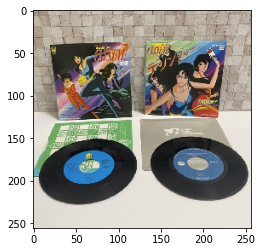

1/1 [==============================] - 0s 331ms/step
[[0.02197851 0.01372178 0.03646648 0.03214958 0.01748157 0.00602374
  0.02157973 0.00707375 0.01779903 0.00614079 0.07232542 0.02696407
  0.0219182  0.02587776 0.04731029 0.04195598 0.01442523 0.03599466
  0.04462877 0.04793902 0.02132729 0.04605138 0.01060827 0.02197912
  0.01810168 0.00890017 0.01182414 0.01747894 0.00867953 0.01176436
  0.05140471 0.01482774 0.02416488 0.01432421 0.05994149 0.0406075
  0.0298163  0.01600734 0.01243667]]
Mariya Takeuchi - Miss M , 7.23
m96578429957.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m18720760061.jpg


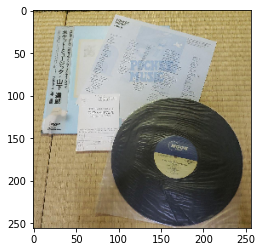

1/1 [==============================] - 0s 276ms/step
[[0.01301369 0.01457379 0.02012594 0.0286401  0.03105911 0.00730631
  0.02508158 0.00973866 0.01330698 0.0044172  0.03786182 0.03276843
  0.02685122 0.0165062  0.04828089 0.04474476 0.01629425 0.04349497
  0.01897057 0.03335454 0.0081359  0.08052198 0.01190833 0.01846802
  0.06331638 0.00989497 0.00922218 0.01484565 0.01221832 0.02088851
  0.03639096 0.01954416 0.05087316 0.0293681  0.0475141  0.01954794
  0.01884266 0.0230024  0.01910521]]
Taeko Ohnuki - Mignonne , 8.05
m18720760061.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m31052956154.jpg


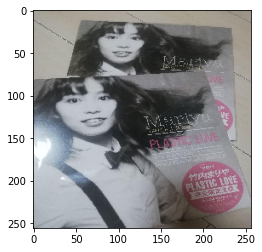

1/1 [==============================] - 0s 326ms/step
[[0.015352   0.01088239 0.02441625 0.03327909 0.02409007 0.00628513
  0.01772803 0.00562323 0.01548323 0.00653396 0.04826413 0.03513665
  0.03382083 0.02378026 0.05641773 0.04764105 0.01552238 0.04551872
  0.04014425 0.03055523 0.02222654 0.05300518 0.0114447  0.02511625
  0.05587685 0.0118663  0.00713876 0.0142638  0.0045451  0.01846141
  0.02430758 0.02617867 0.02400241 0.0302591  0.03797834 0.02495349
  0.03009489 0.02731779 0.01448832]]
Momoko Kikuchi - Adventure , 5.64
m31052956154.jpg: Momoko Kikuchi - Adventure
--------------------------------------------------------------
m12020166923.jpg


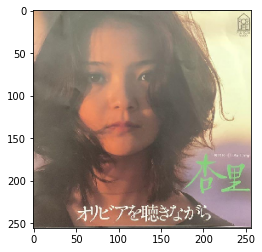

1/1 [==============================] - 0s 293ms/step
[[0.01512397 0.01375588 0.02282498 0.0295278  0.02673148 0.00633142
  0.0161298  0.00610359 0.01498031 0.00501488 0.04819844 0.02767752
  0.03277319 0.02000914 0.07403167 0.06099983 0.02635472 0.03832901
  0.03766576 0.03129734 0.00989156 0.07237896 0.00754541 0.01839601
  0.03186718 0.01030316 0.00496326 0.01326005 0.00569724 0.02194595
  0.02245212 0.03677138 0.03455356 0.03563635 0.03983224 0.02827032
  0.02067437 0.02261254 0.00908762]]
Momoko Kikuchi - Adventure , 7.40
m12020166923.jpg: Momoko Kikuchi - Adventure
--------------------------------------------------------------
m16845919052.jpg


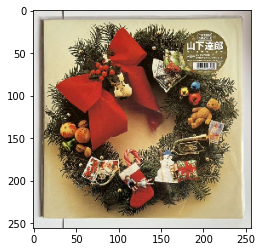

1/1 [==============================] - 0s 306ms/step
[[0.01615442 0.00846946 0.02927729 0.05740579 0.02134391 0.00533124
  0.01578258 0.00742573 0.02143719 0.00475842 0.02836755 0.04375924
  0.01747329 0.01374365 0.02559454 0.07745491 0.02688828 0.06473485
  0.04641917 0.04558437 0.02631238 0.04362297 0.00856374 0.00915323
  0.03927829 0.01239327 0.00844556 0.01725775 0.00493264 0.01509666
  0.03288434 0.0169859  0.03133076 0.01919499 0.0579255  0.03613592
  0.01808235 0.01598185 0.00901604]]
Momoko Kikuchi - Escape From Dimension , 7.75
m16845919052.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m38850206522.jpg


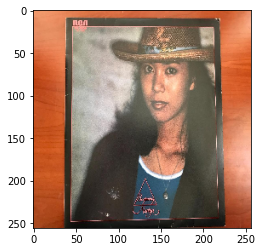

1/1 [==============================] - 0s 273ms/step
[[0.02005449 0.0101384  0.01697996 0.04173985 0.03503811 0.0054148
  0.04087189 0.0079526  0.02573165 0.0056464  0.03832513 0.01903254
  0.0222397  0.01166779 0.02389446 0.02993468 0.01369606 0.03753598
  0.03686861 0.0372968  0.01685104 0.07497306 0.00523503 0.01386819
  0.05358033 0.00848349 0.00759944 0.01458687 0.00436442 0.02377508
  0.02623745 0.01261621 0.045353   0.03032115 0.08717278 0.03266628
  0.01769165 0.0336636  0.01090089]]
Tatsuro Yamashita - Softly , 8.72
m38850206522.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m70387931244.jpg


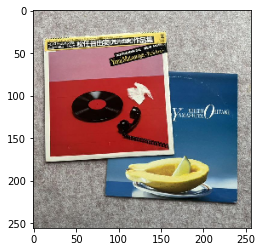

1/1 [==============================] - 0s 284ms/step
[[0.01220216 0.00676218 0.0451377  0.0489983  0.02489226 0.01908034
  0.02648849 0.00982339 0.01938332 0.00886666 0.05780207 0.0200409
  0.04111035 0.00952742 0.03209959 0.03602001 0.02121354 0.04206387
  0.03323049 0.02318442 0.0360015  0.04229001 0.01001287 0.01656567
  0.03310409 0.00676962 0.01196557 0.01047866 0.01267226 0.01816794
  0.05177011 0.01137479 0.02494327 0.02133663 0.07612538 0.02411585
  0.01995241 0.01683309 0.01759279]]
Tatsuro Yamashita - Softly , 7.61
m70387931244.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m62966640085.jpg


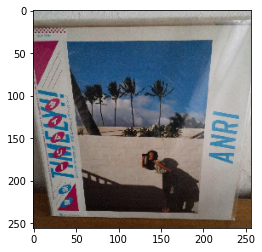

1/1 [==============================] - 0s 244ms/step
[[0.01024307 0.0084435  0.04149064 0.06069876 0.01828796 0.0056093
  0.01541024 0.00675412 0.01222192 0.00402219 0.05374279 0.04787739
  0.01815879 0.01160997 0.03600761 0.0517725  0.04898567 0.05292909
  0.03027369 0.05448829 0.01128411 0.03808646 0.00959115 0.01178356
  0.06810425 0.00906349 0.00941072 0.01699599 0.00552971 0.01687874
  0.02024319 0.02342168 0.0348158  0.02514651 0.04463017 0.02630275
  0.02032562 0.01073764 0.00862086]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 6.81
m62966640085.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m36345618234.jpg


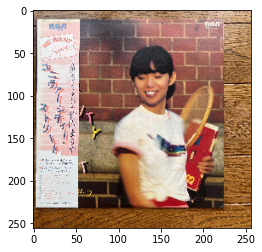

1/1 [==============================] - 0s 276ms/step
[[0.03037699 0.01112993 0.02578699 0.03030106 0.02643198 0.00649374
  0.02782466 0.00722256 0.0216047  0.00519938 0.0581189  0.03028515
  0.0379676  0.02319296 0.03798704 0.02940461 0.0172468  0.03150848
  0.03988913 0.0506121  0.02309516 0.0481036  0.00792145 0.01999732
  0.03787236 0.01062992 0.02216279 0.01342631 0.00593668 0.02567992
  0.01726859 0.02004523 0.03992561 0.01988063 0.06705987 0.02080889
  0.0182839  0.02147886 0.01183811]]
Tatsuro Yamashita - Softly , 6.71
m36345618234.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m18466188311.jpg


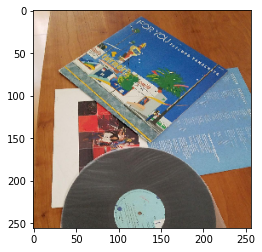

1/1 [==============================] - 0s 244ms/step
[[0.01349734 0.02092472 0.03399958 0.02771648 0.03390019 0.00749822
  0.02200579 0.00711091 0.02104568 0.00508176 0.03200005 0.01858311
  0.0330778  0.02098032 0.02950801 0.03986108 0.01970237 0.0532723
  0.03714599 0.04880638 0.02346258 0.03883114 0.01474296 0.01838321
  0.04296661 0.01286843 0.00929468 0.01487524 0.01165189 0.01877363
  0.03458315 0.0338983  0.02325517 0.02045945 0.069524   0.03052798
  0.02310421 0.01926191 0.01381738]]
Tatsuro Yamashita - Softly , 6.95
m18466188311.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m64031157958.jpg


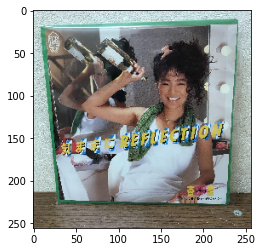

1/1 [==============================] - 0s 327ms/step
[[0.02400513 0.00657969 0.03295249 0.04328635 0.02144053 0.00581818
  0.01898806 0.00795167 0.01616801 0.00667423 0.03699587 0.0299693
  0.02023382 0.01452403 0.02853094 0.03579258 0.02179854 0.0457123
  0.06496241 0.06745492 0.02934964 0.04782461 0.00800593 0.01538628
  0.03491785 0.00802202 0.00965973 0.01851513 0.00329772 0.02413422
  0.02834003 0.01628822 0.03003981 0.01751279 0.08651213 0.02548944
  0.02098038 0.01858436 0.00730069]]
Tatsuro Yamashita - Softly , 8.65
m64031157958.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m51335679249.jpg


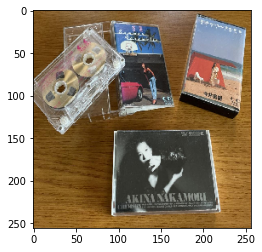

1/1 [==============================] - 0s 275ms/step
[[0.01929319 0.01294771 0.0283521  0.03119195 0.03109505 0.00826253
  0.02217672 0.00613563 0.01689282 0.00820778 0.04080968 0.03344727
  0.03026776 0.02072685 0.04533806 0.03088813 0.02049873 0.0511716
  0.04565089 0.03683321 0.02039393 0.07729276 0.01031288 0.01670033
  0.02956517 0.01262022 0.00607794 0.01634326 0.00447126 0.02091184
  0.02099752 0.03360434 0.02999861 0.01754096 0.05553258 0.02858079
  0.02863579 0.0211574  0.00907474]]
Taeko Ohnuki - Mignonne , 7.73
m51335679249.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m46935897438.jpg


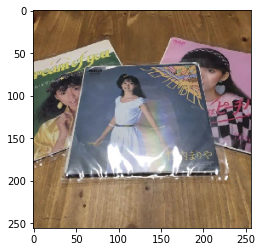

1/1 [==============================] - 0s 251ms/step
[[0.02286906 0.01422575 0.03596783 0.04395114 0.03331804 0.00800321
  0.02813376 0.00589643 0.01898536 0.00409635 0.05227638 0.03126739
  0.04004275 0.03549501 0.05467145 0.05454779 0.01789134 0.03000885
  0.03425835 0.02238776 0.01856668 0.05317555 0.01008352 0.02293227
  0.02828525 0.01075912 0.00649506 0.01277548 0.00578603 0.01779947
  0.018656   0.01560339 0.03892474 0.02387775 0.04804628 0.01930941
  0.0277153  0.02008283 0.01283189]]
Momoko Kikuchi - Adventure , 5.47
m46935897438.jpg: Momoko Kikuchi - Adventure
--------------------------------------------------------------
m61122959523.jpg


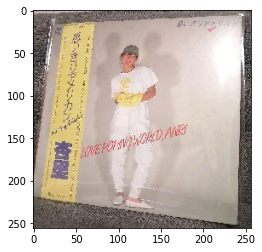

1/1 [==============================] - 0s 293ms/step
[[0.01590182 0.01441203 0.02337315 0.05091666 0.03009549 0.00721821
  0.02123628 0.00844195 0.01721849 0.00477746 0.06768624 0.03349132
  0.02360645 0.01172517 0.03576293 0.03959659 0.0254164  0.03723902
  0.02272475 0.02722305 0.01331065 0.10086491 0.00664286 0.01630863
  0.03413419 0.00824187 0.00787844 0.01399783 0.0061369  0.01691134
  0.02128721 0.02301055 0.04823664 0.02520204 0.07195363 0.02204246
  0.02021689 0.01516246 0.01039698]]
Taeko Ohnuki - Mignonne , 10.09
m61122959523.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m35721748736.jpg


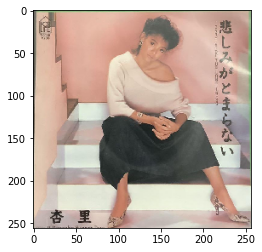

1/1 [==============================] - 0s 280ms/step
[[0.02574692 0.01316063 0.02033123 0.03573938 0.02528567 0.0069488
  0.0210371  0.00934422 0.01741056 0.00632482 0.04941929 0.02373892
  0.02511143 0.02347944 0.03489553 0.04016753 0.0202311  0.02733233
  0.04325932 0.0551644  0.01793566 0.05528156 0.00627371 0.02935225
  0.02834339 0.00615465 0.01246655 0.01748812 0.00505536 0.02682295
  0.02849148 0.01173009 0.04777624 0.01781829 0.06479848 0.02974309
  0.02655566 0.03002811 0.01375574]]
Tatsuro Yamashita - Softly , 6.48
m35721748736.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m16435213736.jpg


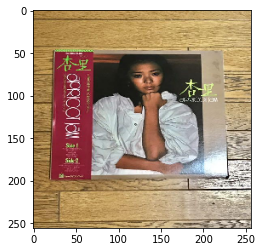

1/1 [==============================] - 0s 293ms/step
[[0.02054514 0.00778472 0.03280205 0.04330947 0.03127344 0.01078788
  0.01184598 0.0097124  0.02619849 0.00632181 0.0693796  0.03051852
  0.02622126 0.01020185 0.03712958 0.02709961 0.01796016 0.03352266
  0.02786593 0.03363702 0.01978002 0.0588835  0.01224111 0.03080216
  0.03388771 0.01179278 0.00943223 0.01294304 0.00600748 0.01216958
  0.0350584  0.01042388 0.04661225 0.01859775 0.08374531 0.02262056
  0.01985167 0.01709181 0.02394129]]
Tatsuro Yamashita - Softly , 8.37
m16435213736.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m95839112261.jpg


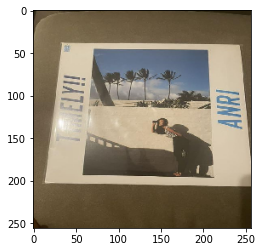

1/1 [==============================] - 0s 302ms/step
[[0.01048815 0.01181624 0.04896879 0.05231217 0.02903466 0.00780995
  0.01497334 0.00639376 0.01315101 0.00541149 0.05642258 0.04397054
  0.02163835 0.01626039 0.04099759 0.04315951 0.02079115 0.04614261
  0.03639092 0.04275001 0.02267005 0.06660576 0.01078728 0.01356883
  0.0416283  0.01094217 0.01141534 0.0145395  0.00700629 0.01558086
  0.02433984 0.01528115 0.02720588 0.02433448 0.05519953 0.02199452
  0.02724421 0.01250658 0.00826619]]
Taeko Ohnuki - Mignonne , 6.66
m95839112261.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m13724146311.jpg


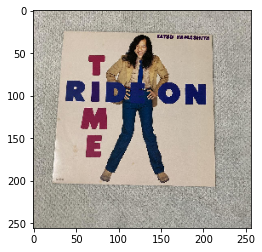

1/1 [==============================] - 0s 358ms/step
[[0.0232148  0.00652866 0.04087211 0.043781   0.01719873 0.00719729
  0.02934158 0.00998266 0.02008081 0.01174843 0.03822002 0.03433125
  0.02859965 0.01024109 0.03351756 0.03097214 0.01722627 0.02167869
  0.04005646 0.04286667 0.02434092 0.06999982 0.0083387  0.01620956
  0.02649841 0.00769225 0.00952545 0.01592796 0.00349302 0.02341558
  0.03312827 0.01257222 0.04816    0.02342475 0.10336868 0.01870078
  0.01929207 0.01753986 0.01071594]]
Tatsuro Yamashita - Softly , 10.34
m13724146311.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m26416702670.jpg


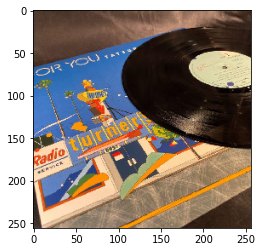

1/1 [==============================] - 0s 275ms/step
[[0.02116375 0.01619303 0.02335322 0.02056927 0.03131063 0.00498918
  0.02916373 0.00787421 0.01530788 0.0055085  0.05465804 0.03993808
  0.01694279 0.02838701 0.03149347 0.06764081 0.01489411 0.02298102
  0.02832652 0.03685627 0.02073286 0.06923135 0.01314546 0.02414978
  0.05377497 0.01039972 0.00905371 0.01822645 0.00943979 0.01679838
  0.0207321  0.02645106 0.03694365 0.01316318 0.05722353 0.02296503
  0.03146025 0.01759721 0.01095999]]
Taeko Ohnuki - Mignonne , 6.92
m26416702670.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m93963960611.jpg


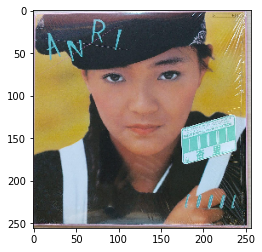

1/1 [==============================] - 0s 331ms/step
[[0.02672431 0.03461675 0.01112854 0.03861905 0.03680177 0.00403556
  0.02886634 0.00668073 0.01470217 0.00347496 0.0498557  0.02538645
  0.0275106  0.0085902  0.03218972 0.06141091 0.02851772 0.04452934
  0.0209768  0.02964523 0.01776825 0.06752244 0.00861062 0.01832682
  0.0360194  0.00631275 0.00945756 0.02203614 0.00717538 0.02026762
  0.0237307  0.01285274 0.05236414 0.0200923  0.05607469 0.0198335
  0.01945592 0.03696666 0.01086955]]
Taeko Ohnuki - Mignonne , 6.75
m93963960611.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m27373947614.jpg


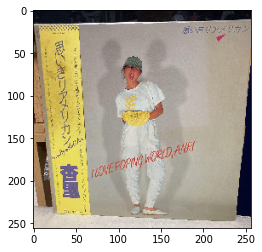

1/1 [==============================] - 0s 297ms/step
[[0.01487359 0.01810446 0.02338042 0.06014581 0.02198423 0.00714765
  0.02964604 0.00672146 0.02283065 0.00559409 0.04700114 0.03596076
  0.02755615 0.00843769 0.02278192 0.05740662 0.02485774 0.02578511
  0.02753882 0.03540977 0.02379967 0.07013269 0.00858855 0.0210087
  0.04253988 0.00709246 0.01127673 0.01530889 0.006866   0.01640834
  0.02196957 0.01890825 0.04314808 0.02487496 0.0710803  0.02154606
  0.02236375 0.01978317 0.01013985]]
Tatsuro Yamashita - Softly , 7.11
m27373947614.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m74284439441.jpg


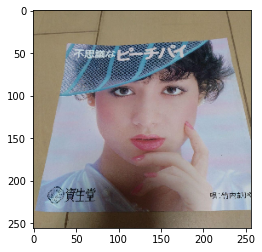

1/1 [==============================] - 0s 289ms/step
[[0.02238518 0.01288691 0.02011023 0.04413139 0.03220652 0.00493141
  0.01986755 0.00703413 0.02586711 0.00400525 0.05693544 0.03118246
  0.0277061  0.01456115 0.03048464 0.04029744 0.01743751 0.05588009
  0.04153769 0.03397515 0.02029514 0.04643986 0.00686568 0.02115361
  0.05212393 0.00745958 0.01210666 0.01629659 0.00542461 0.01669997
  0.02148171 0.020668   0.0361536  0.02371153 0.07124645 0.0241653
  0.01701853 0.02497797 0.01228793]]
Tatsuro Yamashita - Softly , 7.12
m74284439441.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m12124050245.jpg


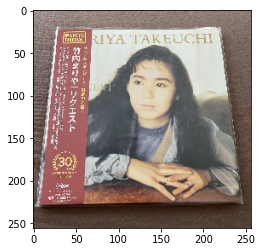

1/1 [==============================] - 0s 290ms/step
[[0.01919678 0.00789617 0.02074459 0.01572955 0.03772313 0.0064195
  0.02060154 0.00749632 0.02967285 0.00787533 0.06354861 0.06205463
  0.02298072 0.02192893 0.04525832 0.02886844 0.0130667  0.03230618
  0.02516578 0.03047464 0.01668871 0.08874369 0.00810487 0.02720832
  0.02949334 0.00701518 0.00606002 0.01103596 0.00436446 0.01868615
  0.02345235 0.0131928  0.03279387 0.03465818 0.07778393 0.02384841
  0.01641521 0.02734136 0.01410447]]
Taeko Ohnuki - Mignonne , 8.87
m12124050245.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m81319532756.jpg


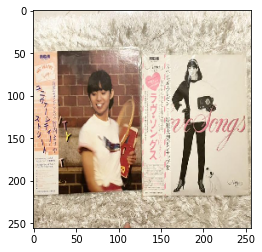

1/1 [==============================] - 0s 267ms/step
[[0.01772529 0.00914799 0.03061494 0.04581845 0.01963251 0.00635201
  0.02123117 0.0070552  0.01455596 0.00591115 0.08569265 0.02730835
  0.02488852 0.01084134 0.05550583 0.05268311 0.01873432 0.04014384
  0.04693163 0.04162397 0.02896326 0.04516844 0.00827092 0.01124845
  0.02643066 0.01501437 0.00905862 0.0135898  0.00545372 0.01557401
  0.03960999 0.01664743 0.03982803 0.0242818  0.05755293 0.02193297
  0.01385372 0.0148509  0.01027178]]
Mariya Takeuchi - Miss M , 8.57
m81319532756.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m15681943279.jpg


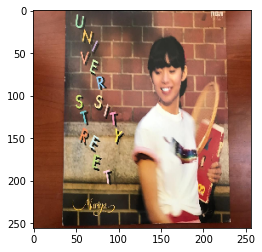

1/1 [==============================] - 0s 292ms/step
[[0.03095367 0.01471587 0.018443   0.03815008 0.02250036 0.00590806
  0.02018186 0.00611809 0.01068317 0.00576921 0.05414292 0.03473537
  0.02899104 0.02413417 0.04487301 0.03546227 0.01942206 0.03163062
  0.03680911 0.07174605 0.01533381 0.04542346 0.01031966 0.01510421
  0.05725121 0.00689466 0.02168816 0.01669065 0.00436416 0.02661281
  0.01970808 0.02525087 0.02606214 0.02518766 0.03940759 0.02997871
  0.02664579 0.02106664 0.01163966]]
Taeko Ohnuki - Cliché , 7.17
m15681943279.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m40322257412.jpg


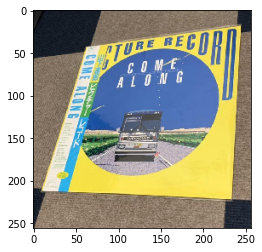

1/1 [==============================] - 0s 294ms/step
[[0.01210823 0.0118298  0.02154444 0.04494103 0.03563944 0.01012584
  0.02782243 0.00903241 0.02066445 0.00577038 0.05518052 0.03741235
  0.02401184 0.00746678 0.02303186 0.03441587 0.02846945 0.04341616
  0.02737531 0.01994004 0.02425716 0.05140613 0.00547766 0.0185353
  0.04011659 0.01377073 0.00730372 0.01921655 0.01003984 0.02869086
  0.0310434  0.01773007 0.05588288 0.01520859 0.10305458 0.01424387
  0.02019577 0.0102967  0.01333098]]
Tatsuro Yamashita - Softly , 10.31
m40322257412.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m85801971334.jpg


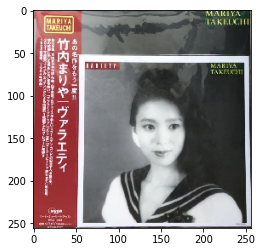

1/1 [==============================] - 0s 294ms/step
[[0.01327933 0.01272916 0.02229261 0.03095677 0.03845633 0.01064133
  0.01858997 0.00919656 0.02997358 0.00490183 0.0479611  0.0462447
  0.03081485 0.00857338 0.02620392 0.03937702 0.02684538 0.03910866
  0.02986323 0.02986144 0.01541556 0.05342001 0.00763665 0.02853754
  0.04331926 0.0063458  0.00601909 0.02328821 0.00550017 0.01982534
  0.02038501 0.01240762 0.04519792 0.02679215 0.06423858 0.04008631
  0.02256111 0.02776569 0.01538687]]
Tatsuro Yamashita - Softly , 6.42
m85801971334.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m16425870820.jpg


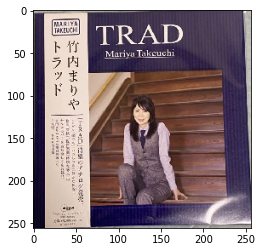

1/1 [==============================] - 0s 269ms/step
[[0.01944756 0.00901853 0.02586244 0.03924537 0.03346214 0.01533565
  0.02268564 0.00760691 0.02687129 0.00718563 0.04380015 0.03911437
  0.05299604 0.01508849 0.03417684 0.03304572 0.02637169 0.03223808
  0.03057913 0.02838544 0.01733704 0.05957513 0.00820267 0.01882904
  0.03206566 0.00730705 0.00571514 0.01383775 0.00425737 0.0212071
  0.02069962 0.01835824 0.04492715 0.03638851 0.06551801 0.02793782
  0.02514195 0.01949526 0.01068241]]
Tatsuro Yamashita - Softly , 6.55
m16425870820.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m87548172008.jpg


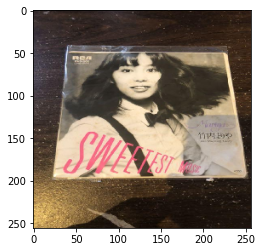

1/1 [==============================] - 0s 410ms/step
[[0.02012845 0.0098234  0.02862903 0.03647989 0.03312204 0.00612828
  0.02403232 0.00762323 0.0170678  0.00711429 0.04118619 0.02885104
  0.03114787 0.01886682 0.04580124 0.05053186 0.01564301 0.04364911
  0.04345737 0.02963524 0.02971688 0.05720314 0.01216801 0.01938906
  0.04385633 0.00952343 0.01245625 0.02235045 0.00615065 0.01998466
  0.01927848 0.01291932 0.03560591 0.02508083 0.05964616 0.01928834
  0.02204275 0.01990475 0.01451612]]
Tatsuro Yamashita - Softly , 5.96
m87548172008.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m39694634191.jpg


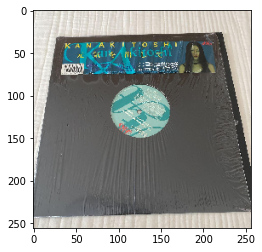

1/1 [==============================] - 0s 312ms/step
[[0.0183899  0.0092857  0.02492353 0.04275132 0.02998635 0.00899764
  0.0207187  0.0080319  0.02860591 0.00604204 0.05804605 0.0358585
  0.04598942 0.01081792 0.02569488 0.0277124  0.02221198 0.05002276
  0.02205082 0.02024791 0.01223709 0.06631069 0.00590218 0.03019852
  0.03401341 0.01043742 0.00767759 0.01188577 0.0072913  0.01764209
  0.03838179 0.01268029 0.03072417 0.02586096 0.09315097 0.02491739
  0.01728868 0.02099263 0.01602144]]
Tatsuro Yamashita - Softly , 9.32
m39694634191.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m17688570037.jpg


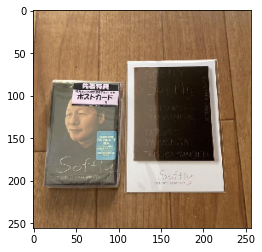

1/1 [==============================] - 0s 288ms/step
[[0.00942961 0.01125158 0.03806554 0.03083901 0.03437002 0.01007362
  0.01843567 0.00754171 0.02155196 0.00490833 0.05705968 0.03608265
  0.03718286 0.00949297 0.03982827 0.03187081 0.01897879 0.03518476
  0.03484203 0.03509877 0.01789072 0.0757343  0.00774004 0.01512718
  0.03546109 0.0098549  0.0071556  0.01380748 0.01006727 0.01611351
  0.03503416 0.01785797 0.03892059 0.03000533 0.05850381 0.02710746
  0.03186604 0.01838454 0.01127935]]
Taeko Ohnuki - Mignonne , 7.57
m17688570037.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m88584493281.jpg


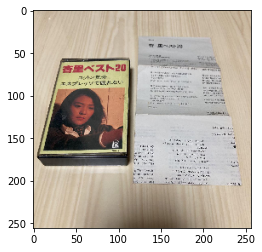

1/1 [==============================] - 0s 287ms/step
[[0.01246318 0.01297935 0.02904509 0.0387095  0.03425249 0.01116125
  0.02132634 0.00857132 0.01556651 0.00600615 0.04112306 0.0311211
  0.04595423 0.01128521 0.04402393 0.04716292 0.01406077 0.03520742
  0.05084919 0.0162244  0.01962227 0.05652847 0.00958295 0.02218697
  0.06334101 0.01216654 0.00542977 0.01831831 0.00998254 0.01856403
  0.01919481 0.0200552  0.03689197 0.02372988 0.0583285  0.02301561
  0.03141898 0.01567882 0.00886995]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 6.33
m88584493281.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m25372332437.jpg


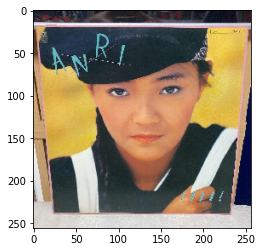

1/1 [==============================] - 0s 295ms/step
[[0.02591542 0.03306315 0.01255633 0.03501178 0.03264359 0.00485669
  0.02908106 0.00716585 0.01530615 0.00351668 0.05382625 0.03266484
  0.02261192 0.00927076 0.03233582 0.05404248 0.02732635 0.03547706
  0.01954583 0.02583461 0.01563924 0.05611176 0.00573085 0.02203699
  0.04236585 0.00845185 0.00904953 0.02437758 0.00785279 0.0194815
  0.03009694 0.01252669 0.07648178 0.01218192 0.07085265 0.01497921
  0.01553787 0.02621401 0.01797836]]
Tatsuro Yamashita - On The Street Corner 2 , 7.65
m25372332437.jpg: Tatsuro Yamashita - On The Street Corner 2
--------------------------------------------------------------
m40577213267.jpg


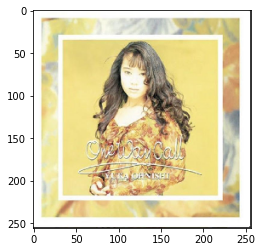

1/1 [==============================] - 0s 256ms/step
[[0.01573266 0.00472328 0.02147862 0.03551918 0.01815757 0.00817798
  0.02474491 0.00558342 0.0229692  0.00602714 0.07538803 0.0903222
  0.02372164 0.00805841 0.03249951 0.04806403 0.02368238 0.03663836
  0.04400648 0.03546957 0.01418332 0.05866155 0.00745815 0.01378644
  0.05780059 0.00819367 0.00449356 0.01269705 0.00282852 0.01980399
  0.01925349 0.01053337 0.02528578 0.02151057 0.08607063 0.01433212
  0.01627073 0.01499279 0.01087915]]
Mariya Takeuchi - Request , 9.03
m40577213267.jpg: Mariya Takeuchi - Request
--------------------------------------------------------------
m38189604327.jpg


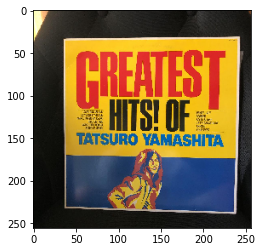

1/1 [==============================] - 0s 338ms/step
[[0.01727884 0.01351511 0.02950162 0.04488844 0.03403052 0.00905192
  0.01859783 0.0109525  0.01681042 0.00718186 0.03868226 0.03560125
  0.01452127 0.00695467 0.02563845 0.05165347 0.02396162 0.0324688
  0.03657251 0.05793473 0.02150763 0.06545553 0.00774403 0.01447176
  0.03760193 0.00877965 0.00974265 0.01528313 0.00978321 0.02828615
  0.02394379 0.01268309 0.04728145 0.01233558 0.07348784 0.03554467
  0.03050981 0.01072231 0.00903761]]
Tatsuro Yamashita - Softly , 7.35
m38189604327.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m41041869320.jpg


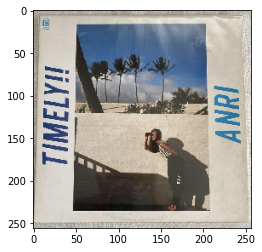

1/1 [==============================] - 0s 272ms/step
[[0.00879928 0.01523795 0.05230734 0.06370795 0.04498117 0.00860306
  0.00937539 0.01243196 0.01051692 0.00416999 0.04761748 0.07474083
  0.01623384 0.01533254 0.0251409  0.02716203 0.02008829 0.044089
  0.02270826 0.06404722 0.01391388 0.05694884 0.00820281 0.0141653
  0.03287142 0.0091113  0.0076126  0.01067567 0.00765958 0.01289226
  0.01946641 0.02028322 0.03170672 0.02249724 0.06097697 0.02846133
  0.03548643 0.01167749 0.00809907]]
Mariya Takeuchi - Request , 7.47
m41041869320.jpg: Mariya Takeuchi - Request
--------------------------------------------------------------
m17119315639.jpg


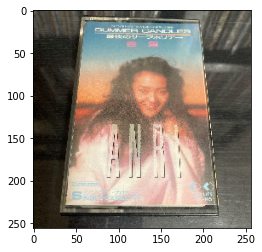

1/1 [==============================] - 0s 299ms/step
[[0.01358552 0.0097237  0.02137557 0.04025806 0.03440066 0.01054868
  0.02242688 0.00955708 0.02490442 0.00501219 0.0608399  0.04753001
  0.03457895 0.00989688 0.03777498 0.03796163 0.02616893 0.05111694
  0.03425499 0.01995468 0.01704266 0.05192887 0.0065869  0.01551433
  0.03215808 0.00914536 0.0049811  0.01766216 0.00613292 0.01566199
  0.02754943 0.0225684  0.04571463 0.03088138 0.07002645 0.02709763
  0.02168307 0.01396981 0.01182413]]
Tatsuro Yamashita - Softly , 7.00
m17119315639.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m74591623251.jpg


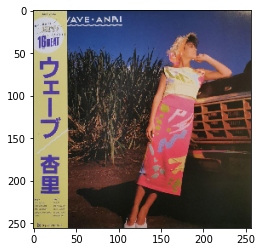

1/1 [==============================] - 0s 294ms/step
[[0.02136109 0.01377183 0.03079108 0.04635912 0.0270422  0.01115322
  0.0217556  0.00643777 0.02297545 0.00456163 0.03779641 0.03901811
  0.01758709 0.01481878 0.03083477 0.05393926 0.02200307 0.03052842
  0.03847712 0.08157859 0.01008601 0.05349311 0.00613612 0.01239421
  0.03747158 0.010993   0.0066442  0.0098684  0.00717701 0.01253633
  0.01687361 0.01736096 0.0474778  0.0307622  0.07311081 0.025639
  0.02170017 0.01732993 0.01015497]]
Taeko Ohnuki - Cliché , 8.16
m74591623251.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m83491343561.jpg


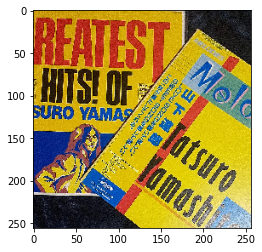

1/1 [==============================] - 0s 324ms/step
[[0.01316292 0.01241433 0.03433724 0.03279945 0.02489976 0.00857632
  0.03089805 0.01490449 0.02435048 0.00478484 0.06445473 0.02862737
  0.017981   0.01317798 0.0301283  0.03273804 0.02207329 0.02896374
  0.03885714 0.04806418 0.01434068 0.03939767 0.00616186 0.01320976
  0.04682755 0.01136413 0.00755928 0.02636995 0.0102573  0.02302328
  0.03271512 0.03520718 0.07920075 0.01624713 0.04722463 0.02383065
  0.01816358 0.01577133 0.00693452]]
Tatsuro Yamashita - On The Street Corner 2 , 7.92
m83491343561.jpg: Tatsuro Yamashita - On The Street Corner 2
--------------------------------------------------------------
m24640199470.jpg


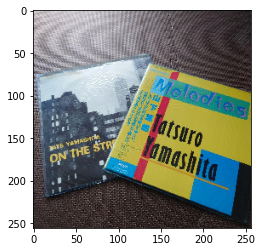

1/1 [==============================] - 0s 349ms/step
[[0.01959613 0.0139259  0.02986703 0.02258083 0.02297798 0.01128889
  0.01659285 0.00850962 0.02319505 0.00529498 0.06577313 0.02775124
  0.02675068 0.01511204 0.06136319 0.0482687  0.02404025 0.02539341
  0.05211943 0.0307482  0.01173848 0.05002165 0.00843234 0.01527945
  0.03379528 0.01140691 0.00526002 0.01294465 0.00762579 0.01756838
  0.02987385 0.04930687 0.04672975 0.01972777 0.04832573 0.02060644
  0.01913998 0.02741138 0.01365576]]
Mariya Takeuchi - Miss M , 6.58
m24640199470.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m66112755294.jpg


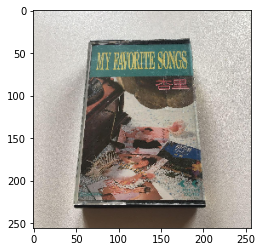

1/1 [==============================] - 0s 409ms/step
[[0.01819877 0.00973616 0.0218711  0.03823277 0.03429577 0.00752506
  0.02345358 0.00620791 0.02002805 0.004593   0.04098976 0.04327395
  0.0246906  0.00852831 0.02744704 0.04235632 0.01333698 0.0522602
  0.04778822 0.03281466 0.02233993 0.07272711 0.00724752 0.01472068
  0.05712526 0.01381569 0.00702922 0.0133517  0.00486633 0.0198844
  0.0237676  0.02085059 0.04688166 0.02014589 0.07121407 0.01722199
  0.01661724 0.01903037 0.01353447]]
Taeko Ohnuki - Mignonne , 7.27
m66112755294.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m88129844754.jpg


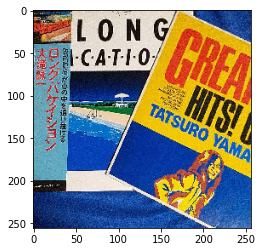

1/1 [==============================] - 1s 519ms/step
[[0.01377929 0.01055743 0.02943936 0.0233274  0.03103005 0.0216411
  0.0238787  0.01139727 0.02604266 0.00854414 0.04488332 0.0408935
  0.02168652 0.01634934 0.02972759 0.03924947 0.0315583  0.02790217
  0.04194786 0.06011742 0.01986311 0.04213316 0.00606241 0.01275962
  0.02729857 0.00906424 0.00889332 0.01519911 0.00981486 0.02705284
  0.02902643 0.02543615 0.04564752 0.02681184 0.07974093 0.03239886
  0.00988031 0.01105217 0.00791165]]
Tatsuro Yamashita - Softly , 7.97
m88129844754.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m75598620462.jpg


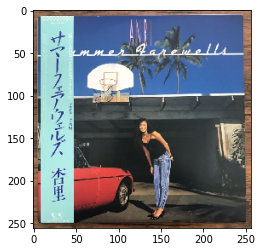

1/1 [==============================] - 0s 477ms/step
[[0.01792291 0.00738254 0.02993884 0.03951518 0.03262112 0.01038535
  0.01257607 0.00615756 0.02873097 0.00905338 0.03952465 0.05639594
  0.01730549 0.01505099 0.02426913 0.0568938  0.03713438 0.03310035
  0.03983065 0.06321051 0.01866196 0.04904347 0.00853727 0.01230912
  0.03058819 0.00907435 0.00957366 0.01586031 0.00453483 0.01585985
  0.02263878 0.01447736 0.04451508 0.02166365 0.07514945 0.02805756
  0.01616884 0.02115691 0.0051295 ]]
Tatsuro Yamashita - Softly , 7.51
m75598620462.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m95500282369.jpg


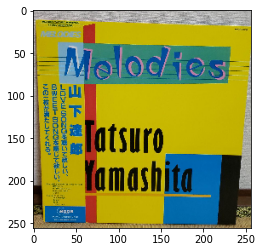

1/1 [==============================] - 0s 330ms/step
[[0.01439538 0.01391819 0.02762836 0.04633281 0.03780508 0.01258982
  0.01726955 0.01601917 0.01687066 0.00608665 0.06023896 0.04802916
  0.01942526 0.00788931 0.03053923 0.03421301 0.02729764 0.02997187
  0.03342625 0.04170147 0.01752716 0.05034548 0.00911404 0.01473425
  0.03790688 0.00918065 0.00836451 0.01149493 0.01083417 0.02713162
  0.02375782 0.01522799 0.05294184 0.02221976 0.06574456 0.02464746
  0.02502297 0.02538023 0.00677583]]
Tatsuro Yamashita - Softly , 6.57
m95500282369.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m56764502742.jpg


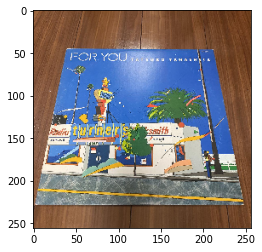

1/1 [==============================] - 0s 302ms/step
[[0.01778118 0.00968461 0.0356508  0.04865367 0.02098484 0.00521417
  0.01361083 0.0050977  0.0273065  0.00490009 0.05909438 0.03958615
  0.02250744 0.01629928 0.02292879 0.04436936 0.03115594 0.06337963
  0.03585642 0.04655633 0.02033188 0.05853957 0.00655486 0.00957616
  0.04201193 0.0076046  0.02113425 0.01477489 0.00449113 0.01168189
  0.02613346 0.01316839 0.02631777 0.01935748 0.08792178 0.02524208
  0.01507457 0.01107164 0.00839364]]
Tatsuro Yamashita - Softly , 8.79
m56764502742.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m30413324052.jpg


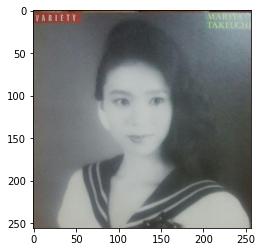

1/1 [==============================] - 0s 408ms/step
[[0.01881845 0.01710077 0.0182683  0.0369008  0.03333075 0.00474032
  0.02728687 0.00554556 0.01776686 0.00559162 0.0367378  0.02981219
  0.02628537 0.01409542 0.05840216 0.05365972 0.02771765 0.03135085
  0.03600841 0.02732231 0.01192786 0.06687783 0.00641703 0.02025779
  0.03989924 0.00892071 0.00540433 0.02180172 0.00511092 0.03385104
  0.02154649 0.02698764 0.03386847 0.03506071 0.0522889  0.02771728
  0.0183253  0.02696019 0.01003437]]
Taeko Ohnuki - Mignonne , 6.69
m30413324052.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m84281438794.jpg


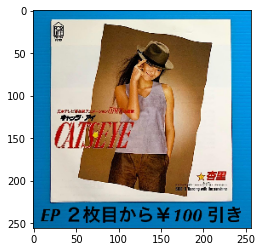

1/1 [==============================] - 0s 363ms/step
[[0.02861987 0.00771912 0.04097145 0.0406678  0.02509324 0.00753497
  0.03234649 0.00836716 0.01607837 0.00676941 0.03189412 0.02758589
  0.02755401 0.00664696 0.02515289 0.05573568 0.01714169 0.02105723
  0.05302706 0.09172785 0.0237019  0.05023491 0.00767911 0.01654301
  0.05052387 0.0075277  0.00940681 0.01123485 0.00495944 0.02632327
  0.02528688 0.00880009 0.03261372 0.01433007 0.06965454 0.01842501
  0.02353137 0.02088199 0.00665022]]
Taeko Ohnuki - Cliché , 9.17
m84281438794.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m25309952882.jpg


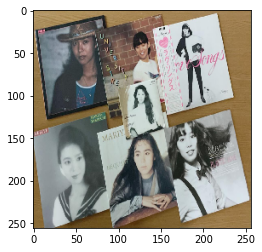

1/1 [==============================] - 0s 297ms/step
[[0.01922899 0.01336466 0.04062878 0.0319842  0.0278032  0.00800609
  0.02414606 0.01095741 0.01128095 0.00623587 0.04077056 0.02858847
  0.0240499  0.0212111  0.03061843 0.04980525 0.02060464 0.02758002
  0.03877316 0.08188926 0.03164035 0.05511424 0.01421716 0.01103384
  0.03900222 0.00627134 0.00873902 0.01519261 0.00642202 0.01395807
  0.03548039 0.01673459 0.02885743 0.02253135 0.04144478 0.02522241
  0.04030163 0.02116058 0.00914897]]
Taeko Ohnuki - Cliché , 8.19
m25309952882.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m31587442726.jpg


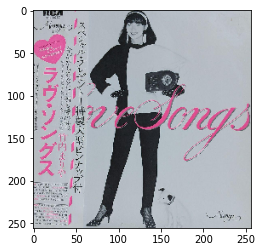

1/1 [==============================] - 0s 361ms/step
[[0.0247148  0.01356206 0.0241845  0.04874953 0.02035545 0.00714517
  0.01985169 0.00659081 0.01980523 0.00925335 0.04055435 0.04268214
  0.02102856 0.01354192 0.03638932 0.05191997 0.02056936 0.02396756
  0.03287956 0.04129691 0.0114705  0.05967253 0.00643047 0.02382612
  0.03372202 0.00804718 0.00798399 0.02031798 0.00428601 0.02189849
  0.02147243 0.01548554 0.05431507 0.01689344 0.08346535 0.03251687
  0.02132557 0.02062457 0.01720354]]
Tatsuro Yamashita - Softly , 8.35
m31587442726.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m45086183976.jpg


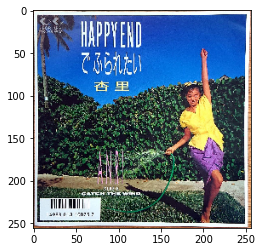

1/1 [==============================] - 0s 274ms/step
[[0.0097816  0.00957831 0.02657093 0.07273013 0.03383774 0.00814399
  0.01906329 0.00740782 0.02625923 0.00595797 0.05916546 0.05936752
  0.03307341 0.00992413 0.03621084 0.04076276 0.02525057 0.03794154
  0.03550752 0.03028775 0.02040001 0.0532736  0.00781642 0.01136307
  0.04170931 0.00674706 0.00434484 0.01833288 0.00295527 0.0206703
  0.01823218 0.01154715 0.0320723  0.03201581 0.06799348 0.02514968
  0.01707701 0.01781103 0.00366609]]
Anri (2) - Wave , 7.27
m45086183976.jpg: Anri (2) - Wave
--------------------------------------------------------------
m70212275506.jpg


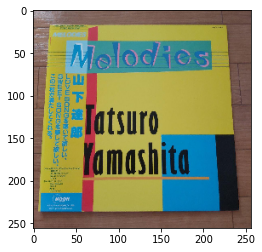

1/1 [==============================] - 0s 345ms/step
[[0.01462049 0.01090972 0.02476055 0.04258914 0.03610351 0.00802263
  0.01939883 0.01399881 0.01727328 0.00490112 0.05888219 0.0452821
  0.01790024 0.01141737 0.02838229 0.04235317 0.02220482 0.03625741
  0.03939175 0.04461915 0.01967284 0.0495618  0.00911671 0.01589973
  0.05026377 0.0084046  0.00721353 0.01829742 0.00922675 0.03250976
  0.02738732 0.01744114 0.04065294 0.02073122 0.05486581 0.02823326
  0.02168082 0.02158675 0.00798527]]
Mariya Takeuchi - Miss M , 5.89
m70212275506.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m20865534211.jpg


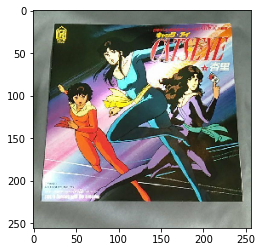

1/1 [==============================] - 0s 333ms/step
[[0.02811948 0.01341947 0.02769585 0.04088378 0.03522493 0.00789372
  0.01914719 0.00513252 0.01746787 0.01023293 0.03632973 0.02909716
  0.01936675 0.02093904 0.02173842 0.04382129 0.01894355 0.05312823
  0.03943651 0.04760769 0.03576659 0.04789123 0.0058029  0.01496604
  0.03435329 0.00572935 0.02524918 0.02568781 0.00580707 0.03182948
  0.02734828 0.00985094 0.0255637  0.01445328 0.06486096 0.02964561
  0.03106733 0.01634451 0.01215629]]
Tatsuro Yamashita - Softly , 6.49
m20865534211.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m29363062369.jpg


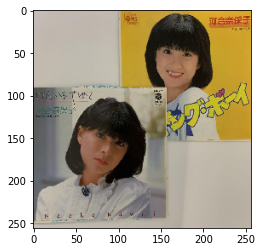

1/1 [==============================] - 0s 319ms/step
[[0.01827033 0.01226914 0.02072659 0.03881015 0.02119186 0.00833057
  0.02492126 0.00627677 0.02043055 0.00526916 0.065112   0.05062722
  0.0167583  0.01828297 0.04880625 0.07666123 0.018959   0.03409122
  0.03174727 0.03110417 0.01539779 0.06616011 0.00946947 0.01307205
  0.03655729 0.01131982 0.00768432 0.01153834 0.00670153 0.01812933
  0.02871788 0.01960402 0.03327129 0.02156094 0.04666983 0.03035965
  0.02215637 0.02067007 0.01231393]]
Momoko Kikuchi - Escape From Dimension , 7.67
m29363062369.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m93408328181.jpg


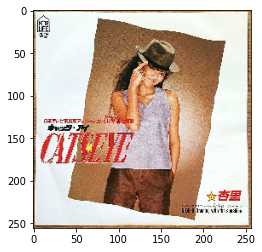

1/1 [==============================] - 0s 392ms/step
[[0.02471708 0.01494516 0.03330244 0.03672778 0.02623953 0.00763274
  0.01947517 0.00853307 0.01976443 0.00565788 0.05922134 0.02194238
  0.02160595 0.0106286  0.02370533 0.05945453 0.01689073 0.02288057
  0.03658901 0.06646975 0.02513733 0.04453874 0.00968827 0.01589199
  0.04630044 0.00697559 0.00819309 0.01674192 0.00642846 0.01747466
  0.01470779 0.01859591 0.03913881 0.0211741  0.0872129  0.02208659
  0.0260195  0.03098336 0.00632713]]
Tatsuro Yamashita - Softly , 8.72
m93408328181.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m20837153021.jpg


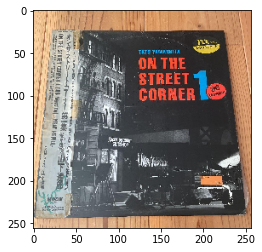

1/1 [==============================] - 0s 333ms/step
[[0.01281409 0.01470964 0.02979014 0.04121418 0.02462908 0.00795011
  0.01871164 0.01725344 0.01899762 0.00853796 0.04822387 0.03617756
  0.02568258 0.01314628 0.03176339 0.02720689 0.02690321 0.04159882
  0.02307695 0.03491346 0.01285985 0.06440941 0.01148574 0.01428982
  0.02997058 0.00942155 0.00916303 0.01556772 0.00850448 0.01629935
  0.02606778 0.01912346 0.0922955  0.02100953 0.07076527 0.03012763
  0.01929082 0.0162019  0.00984573]]
Tatsuro Yamashita - On The Street Corner 2 , 9.23
m20837153021.jpg: Tatsuro Yamashita - On The Street Corner 2
--------------------------------------------------------------
m43503908106.jpg


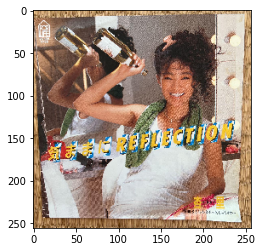

1/1 [==============================] - 0s 389ms/step
[[0.0229226  0.00881188 0.01800582 0.03668329 0.02721182 0.00457213
  0.01199817 0.00699637 0.01694582 0.00475584 0.05196674 0.05784046
  0.03377216 0.01964602 0.04644231 0.0412304  0.02195925 0.05088739
  0.0301549  0.04030383 0.02076078 0.05662367 0.00773856 0.00970531
  0.02526315 0.00789753 0.01009111 0.01514287 0.00383008 0.01576097
  0.01791579 0.03285134 0.02908777 0.02403244 0.08713395 0.02536695
  0.02546278 0.02304865 0.00917903]]
Tatsuro Yamashita - Softly , 8.71
m43503908106.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m22423678417.jpg


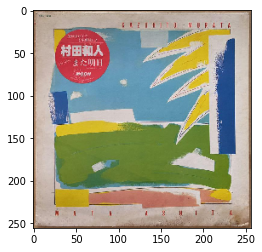

1/1 [==============================] - 0s 308ms/step
[[0.00973405 0.0120254  0.02758293 0.0576367  0.03274275 0.01111423
  0.01891392 0.0104935  0.01420408 0.00527434 0.04246125 0.04431614
  0.01713009 0.00843745 0.02903996 0.07541569 0.04587623 0.03896443
  0.03491335 0.0379594  0.01676177 0.04771753 0.00783202 0.01220933
  0.02880798 0.008113   0.00468395 0.01629848 0.00837989 0.02072554
  0.03897269 0.01479593 0.04330498 0.0189644  0.05481477 0.03249777
  0.02471955 0.01414671 0.01201791]]
Momoko Kikuchi - Escape From Dimension , 7.54
m22423678417.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m65788429964.jpg


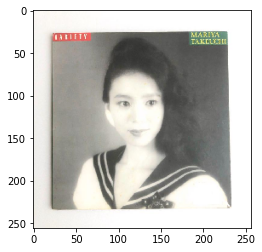

1/1 [==============================] - 0s 325ms/step
[[0.01296032 0.01250374 0.02483196 0.04192935 0.04348893 0.00421053
  0.03132947 0.00984398 0.01404521 0.00792783 0.03565254 0.02607148
  0.03255229 0.01150679 0.04939394 0.04777225 0.01477995 0.03171371
  0.02624547 0.04676587 0.01883684 0.07930999 0.01025426 0.02031732
  0.04389438 0.00731389 0.01055175 0.01201666 0.00602475 0.02560145
  0.02389634 0.00931763 0.03154194 0.02910316 0.0583998  0.02830773
  0.0200652  0.0271928  0.01252851]]
Taeko Ohnuki - Mignonne , 7.93
m65788429964.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m87168627374.jpg


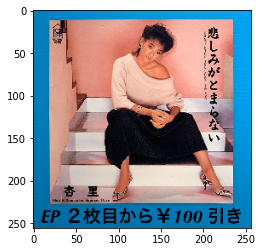

1/1 [==============================] - 0s 305ms/step
[[0.02664399 0.0117641  0.02883236 0.03168844 0.02522828 0.00741048
  0.03261402 0.01025075 0.0190374  0.00930362 0.05258825 0.02181507
  0.02346228 0.01636175 0.0277525  0.058174   0.0176503  0.02128151
  0.04011161 0.08657616 0.01615154 0.05100712 0.00593402 0.0233064
  0.02819846 0.00626224 0.01256503 0.01009933 0.00637506 0.02748775
  0.03789099 0.00828229 0.03228411 0.0152655  0.05855734 0.02886558
  0.02748379 0.02318666 0.0122499 ]]
Taeko Ohnuki - Cliché , 8.66
m87168627374.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m52820097630.jpg


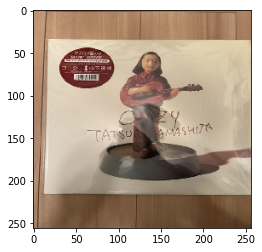

1/1 [==============================] - 0s 336ms/step
[[0.02276944 0.00643112 0.02607097 0.05168355 0.02309366 0.00953031
  0.03036477 0.00735377 0.02125209 0.0082784  0.03314951 0.03803382
  0.02881598 0.0120232  0.03937127 0.05861948 0.01732844 0.02895163
  0.03542253 0.03444326 0.01507082 0.06069743 0.00694787 0.01868695
  0.03419689 0.00986911 0.01004565 0.01367924 0.00503878 0.02234483
  0.03014047 0.01005551 0.03910457 0.02843061 0.08862523 0.0182702
  0.01932374 0.01730007 0.01918481]]
Tatsuro Yamashita - Softly , 8.86
m52820097630.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m36318346744.jpg


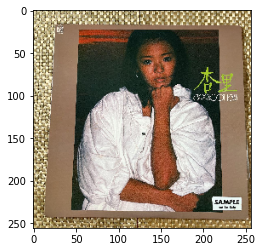

1/1 [==============================] - 0s 332ms/step
[[0.02747242 0.01872386 0.02882647 0.03805158 0.02879465 0.00703451
  0.0190584  0.0104105  0.01837479 0.00742476 0.06570821 0.05086086
  0.02329502 0.01406957 0.03180576 0.05633686 0.01536858 0.02758107
  0.02445666 0.04139266 0.03309525 0.05168804 0.01466181 0.01872274
  0.03731391 0.00824242 0.00795061 0.01530457 0.00881753 0.00895724
  0.03132194 0.00940094 0.0260628  0.01180787 0.06970081 0.02791158
  0.03191927 0.01812445 0.01394904]]
Tatsuro Yamashita - Softly , 6.97
m36318346744.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m15659786712.jpg


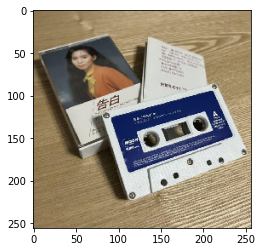

1/1 [==============================] - 0s 303ms/step
[[0.01483778 0.01105699 0.01958401 0.0259225  0.0248171  0.00750308
  0.01673473 0.01174039 0.01007546 0.00431081 0.05943841 0.03149815
  0.03635558 0.01804085 0.04894599 0.03659166 0.02106857 0.02300033
  0.04518828 0.05586428 0.0229206  0.05563658 0.01632456 0.02553036
  0.03136321 0.00876676 0.00520503 0.01793604 0.00448676 0.02411049
  0.01929984 0.06632858 0.03607953 0.02313577 0.04551914 0.01590321
  0.03098238 0.01970921 0.0081869 ]]
Tatsuro Yamashita - On The Street Corner , 6.63
m15659786712.jpg: Tatsuro Yamashita - On The Street Corner
--------------------------------------------------------------
m27008227029.jpg


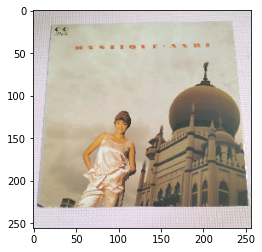

1/1 [==============================] - 0s 378ms/step
[[0.01320821 0.01300178 0.02810308 0.06729285 0.03053561 0.00708435
  0.01962279 0.00713274 0.01555332 0.0067244  0.05819982 0.05109511
  0.02919266 0.01789218 0.0541904  0.04782409 0.02355254 0.03703206
  0.02954974 0.03094841 0.01597788 0.05733241 0.00768953 0.01186711
  0.03219108 0.00629497 0.00743293 0.01072336 0.00714537 0.02558172
  0.02221202 0.02222672 0.03800284 0.03085663 0.05956169 0.02403652
  0.01405209 0.01331648 0.00576248]]
Anri (2) - Wave , 6.73
m27008227029.jpg: Anri (2) - Wave
--------------------------------------------------------------
m10304734067.jpg


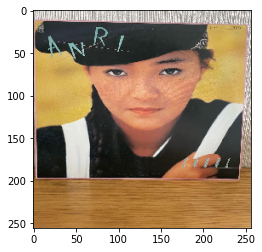

1/1 [==============================] - 0s 299ms/step
[[0.0237058  0.01948619 0.01508339 0.02943928 0.03764429 0.00616039
  0.02402275 0.00786087 0.02044897 0.00504055 0.05144819 0.03920994
  0.02944309 0.01401469 0.03571782 0.05150574 0.02399866 0.03708259
  0.02371233 0.02314981 0.01119757 0.07668554 0.00971234 0.0254492
  0.03024594 0.00982117 0.00520003 0.02222157 0.00671267 0.03041533
  0.03194989 0.01159984 0.04491071 0.01884502 0.05927983 0.02173965
  0.01850498 0.03220281 0.01513053]]
Taeko Ohnuki - Mignonne , 7.67
m10304734067.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m61759563481.jpg


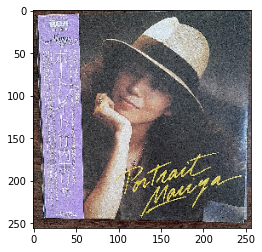

1/1 [==============================] - 0s 347ms/step
[[0.02551097 0.01255117 0.01880601 0.05190381 0.04229925 0.00505529
  0.01963906 0.00512037 0.01354828 0.00714508 0.04765333 0.03595757
  0.02302028 0.01419001 0.03104834 0.04315346 0.02106463 0.03548893
  0.03186838 0.02756647 0.01636354 0.08091018 0.01047343 0.01844107
  0.0379577  0.00647443 0.00928724 0.02324929 0.00458857 0.02263366
  0.01117668 0.02100498 0.04080429 0.02184297 0.07644092 0.03295118
  0.02455592 0.02074258 0.00751064]]
Taeko Ohnuki - Mignonne , 8.09
m61759563481.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m49044580256.jpg


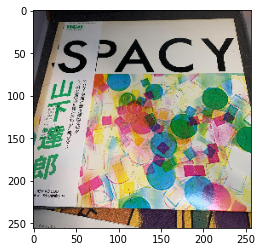

1/1 [==============================] - 0s 259ms/step
[[0.01768406 0.01516178 0.02204096 0.04327761 0.04975453 0.01451509
  0.01403547 0.01664078 0.01967961 0.00654388 0.06743553 0.03797653
  0.02558076 0.01457791 0.02365666 0.03334354 0.02335197 0.02660969
  0.01930534 0.04900464 0.01411579 0.04185798 0.00615705 0.01534864
  0.0177281  0.00534096 0.01219076 0.01073499 0.00902319 0.01733804
  0.0210122  0.01271506 0.05458559 0.02350583 0.07420214 0.06417906
  0.02915932 0.01641894 0.01421001]]
Tatsuro Yamashita - Softly , 7.42
m49044580256.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m11759412689.jpg


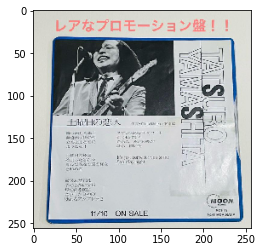

1/1 [==============================] - 0s 285ms/step
[[0.01246648 0.00839692 0.03415156 0.04896209 0.02656845 0.01247257
  0.02135999 0.00968311 0.01732397 0.007858   0.0465029  0.04926313
  0.02127442 0.00803818 0.03008624 0.04381036 0.02236995 0.02784418
  0.05706121 0.04786474 0.01899444 0.05545374 0.01084235 0.01979633
  0.03343322 0.0090924  0.00793986 0.01640379 0.00761262 0.03131212
  0.02425974 0.01151873 0.02194484 0.02399059 0.08720121 0.02677676
  0.01839668 0.0134348  0.00823734]]
Tatsuro Yamashita - Softly , 8.72
m11759412689.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m72904340935.jpg


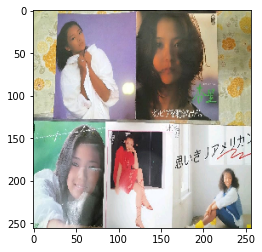

1/1 [==============================] - 0s 276ms/step
[[0.01326669 0.01823184 0.03306468 0.03417835 0.03207962 0.0095122
  0.02360159 0.00430105 0.01073889 0.00648529 0.07038753 0.0302254
  0.01686042 0.02286462 0.04193846 0.07610498 0.02383537 0.02962616
  0.03107463 0.0456057  0.01833992 0.0431053  0.00630209 0.01378077
  0.02116976 0.01359283 0.0058368  0.02998302 0.00657418 0.01705512
  0.03565627 0.02301048 0.02511089 0.01257172 0.03432786 0.04977247
  0.04222275 0.01708349 0.01052084]]
Momoko Kikuchi - Escape From Dimension , 7.61
m72904340935.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m45445094887.jpg


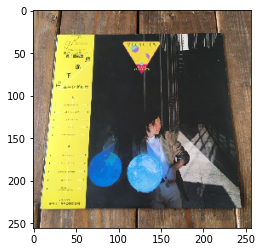

1/1 [==============================] - 0s 292ms/step
[[0.01041714 0.01031064 0.0164053  0.04144039 0.03500134 0.00915321
  0.0144498  0.01098864 0.02048952 0.00474511 0.07003269 0.04466835
  0.03027641 0.01446162 0.03495312 0.02905994 0.02686686 0.04678073
  0.02531027 0.03474837 0.01447159 0.0840989  0.00589127 0.01144964
  0.04074348 0.00621673 0.00982614 0.00938484 0.00859108 0.01497132
  0.03119257 0.02101259 0.04013307 0.02193659 0.0857153  0.02112685
  0.02231149 0.0127056  0.00766142]]
Tatsuro Yamashita - Softly , 8.57
m45445094887.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m67845248416.jpg


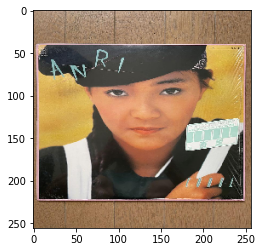

1/1 [==============================] - 0s 276ms/step
[[0.02403752 0.02623948 0.02162364 0.03522805 0.04153544 0.00544356
  0.03326908 0.00801654 0.0173155  0.00407089 0.04851395 0.03655224
  0.02640137 0.01428015 0.02903248 0.04520539 0.02095249 0.03455441
  0.02297509 0.03139289 0.02258986 0.0836099  0.00953517 0.0190366
  0.03254809 0.00823299 0.0109954  0.01814776 0.0076745  0.02560773
  0.0325412  0.00849409 0.03697542 0.01517536 0.05541248 0.01719903
  0.02573084 0.03160844 0.01224498]]
Taeko Ohnuki - Mignonne , 8.36
m67845248416.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m94222835900.jpg


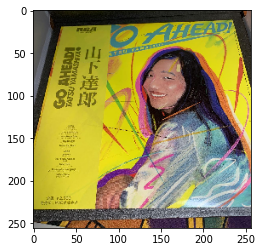

1/1 [==============================] - 0s 284ms/step
[[0.02446596 0.01007764 0.01341882 0.04076001 0.03635433 0.00696017
  0.02797819 0.00758101 0.01995637 0.00361025 0.04142565 0.04009888
  0.0288755  0.01947728 0.04376397 0.04884347 0.01901532 0.02285479
  0.03653671 0.05194004 0.01868977 0.04481145 0.00836905 0.01381885
  0.046431   0.00939942 0.01084888 0.02405058 0.00538175 0.01582548
  0.02138232 0.02028057 0.03442813 0.02257603 0.06612908 0.02539929
  0.02929656 0.02869975 0.01018761]]
Tatsuro Yamashita - Softly , 6.61
m94222835900.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m69321241465.jpg


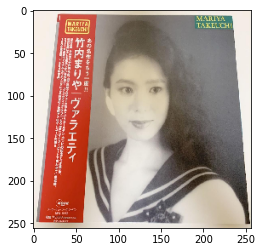

1/1 [==============================] - 0s 258ms/step
[[0.01273146 0.01390389 0.02113525 0.0312047  0.04805109 0.00698701
  0.03115844 0.01034455 0.02246085 0.00583681 0.04741178 0.03661355
  0.02524556 0.01678314 0.03260161 0.05266015 0.01898066 0.02363488
  0.02312057 0.03935466 0.01771348 0.08209081 0.0106563  0.0224295
  0.03209535 0.00575874 0.0066732  0.01710474 0.00508509 0.01976176
  0.01938529 0.01232003 0.04432735 0.03364746 0.06522968 0.02626874
  0.02109948 0.02831354 0.00981884]]
Taeko Ohnuki - Mignonne , 8.21
m69321241465.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m25206781621.jpg


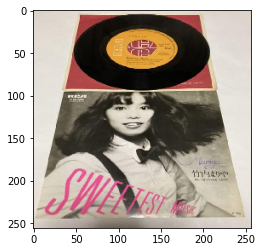

1/1 [==============================] - 0s 319ms/step
[[0.01972019 0.00841735 0.02372971 0.01644975 0.02200014 0.00628789
  0.03601144 0.0072143  0.02371961 0.00667548 0.04133548 0.03801147
  0.02916195 0.01512452 0.03915602 0.0486685  0.01426367 0.02455174
  0.05755149 0.04241994 0.0410128  0.04312445 0.01062829 0.02516002
  0.07531781 0.00526088 0.0065117  0.01369384 0.00586819 0.02051649
  0.02399126 0.00849868 0.02921137 0.02490015 0.07342553 0.01454352
  0.01846754 0.02476212 0.01463479]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 7.53
m25206781621.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m82116820522.jpg


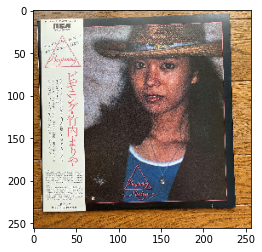

1/1 [==============================] - 0s 247ms/step
[[0.0173403  0.01320514 0.0202075  0.04683968 0.03836163 0.00655211
  0.02794599 0.01013426 0.03719607 0.00531133 0.05443353 0.03503979
  0.02215714 0.00910662 0.0161401  0.02456213 0.02246908 0.03687727
  0.03582937 0.03775452 0.01429905 0.07118613 0.00549756 0.01695099
  0.04378518 0.01007713 0.00743544 0.01255844 0.00584532 0.02422197
  0.02407913 0.01744837 0.05078888 0.0220111  0.08129019 0.02647731
  0.01409596 0.02459465 0.0098936 ]]
Tatsuro Yamashita - Softly , 8.13
m82116820522.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m81427430861.jpg


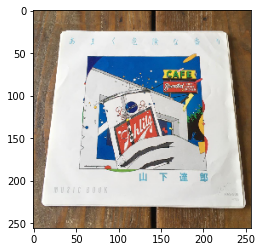

1/1 [==============================] - 0s 299ms/step
[[0.01770677 0.00775706 0.03162749 0.03930177 0.0292118  0.00517904
  0.02882967 0.00608853 0.01934062 0.00247372 0.04130609 0.01681829
  0.02180222 0.01238935 0.02773217 0.031644   0.01516512 0.07414099
  0.03758686 0.0455288  0.03485939 0.04662201 0.00649728 0.01910813
  0.07647838 0.00768159 0.01311216 0.01190469 0.00634266 0.0230542
  0.03039359 0.01512735 0.02985667 0.02105214 0.06005498 0.03323074
  0.02097017 0.01500748 0.01701607]]
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 7.65
m81427430861.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
--------------------------------------------------------------
m58030722691.jpg


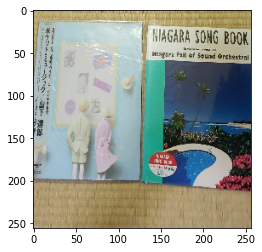

1/1 [==============================] - 0s 263ms/step
[[0.01495277 0.01082719 0.03375034 0.0378468  0.03321795 0.01016395
  0.02120847 0.00774201 0.01538844 0.00646434 0.03164672 0.04218484
  0.04648145 0.01811667 0.04131189 0.03079914 0.01504954 0.05942976
  0.03500889 0.02628    0.01913909 0.06298503 0.00628453 0.01309305
  0.02636636 0.00993355 0.00889987 0.0179118  0.00531916 0.0183027
  0.03730213 0.02136159 0.03614663 0.02697139 0.08198554 0.02352796
  0.02271141 0.01839978 0.0054872 ]]
Tatsuro Yamashita - Softly , 8.20
m58030722691.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m56448785843.jpg


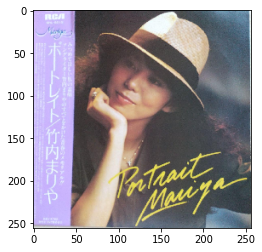

1/1 [==============================] - 0s 265ms/step
[[0.02454767 0.01276733 0.01926544 0.04176633 0.05107023 0.00367097
  0.02295717 0.00525486 0.01194382 0.00635027 0.03332315 0.0386974
  0.02406982 0.01502938 0.03612691 0.06021677 0.01673693 0.02989367
  0.03757119 0.04301838 0.0131105  0.07661062 0.00889042 0.01572367
  0.04850513 0.00576299 0.00882071 0.02326024 0.0033086  0.02150293
  0.00881299 0.02578638 0.03952672 0.02327442 0.05092487 0.02953984
  0.03430204 0.02160816 0.00645103]]
Taeko Ohnuki - Mignonne , 7.66
m56448785843.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m84780693546.jpg


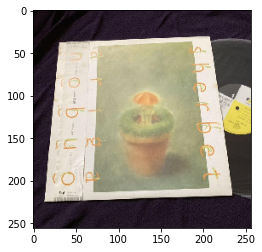

1/1 [==============================] - 0s 290ms/step
[[0.01257625 0.01027879 0.02751454 0.0382836  0.03263012 0.00734804
  0.02398596 0.00860212 0.01502802 0.00393177 0.05651598 0.03156105
  0.01986984 0.01644769 0.03828106 0.0382259  0.02112288 0.03527522
  0.04601316 0.04052059 0.01608051 0.07917142 0.00773859 0.02247692
  0.05033049 0.00785747 0.00870571 0.01068396 0.0086125  0.02359197
  0.01942341 0.01799051 0.03575345 0.0192328  0.07449767 0.02658742
  0.02190176 0.01465902 0.0106919 ]]
Taeko Ohnuki - Mignonne , 7.92
m84780693546.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m92370877764.jpg


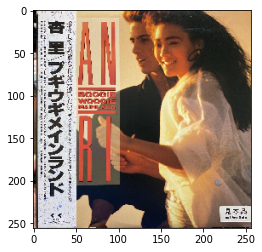

1/1 [==============================] - 0s 277ms/step
[[0.02299044 0.01177123 0.02238375 0.04755919 0.02255503 0.00818291
  0.01826197 0.00452369 0.02278714 0.00436454 0.03492953 0.05175162
  0.02653681 0.01524984 0.03903788 0.05139474 0.01704059 0.03086328
  0.05257512 0.05401263 0.01754047 0.05054877 0.00736233 0.02002544
  0.04617878 0.01046468 0.00480196 0.02095451 0.00342477 0.02343249
  0.01562805 0.01996073 0.03481401 0.02128085 0.06420789 0.02412246
  0.02530541 0.02238309 0.00879137]]
Tatsuro Yamashita - Softly , 6.42
m92370877764.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m66822781444.jpg


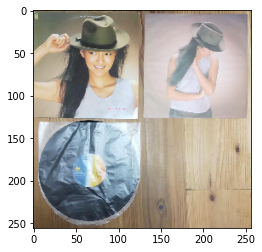

1/1 [==============================] - 0s 291ms/step
[[0.01889997 0.01701882 0.02066881 0.04149757 0.02268988 0.01004195
  0.01895499 0.00478984 0.03091564 0.00688815 0.07464246 0.0477639
  0.02767892 0.01225904 0.03674148 0.05534245 0.02603027 0.03899441
  0.03977345 0.02729837 0.01629715 0.05837735 0.00502633 0.01728399
  0.02635941 0.00897579 0.00403346 0.01637978 0.00645134 0.01178717
  0.02975214 0.02122071 0.02887563 0.02827345 0.04785024 0.02942233
  0.03133685 0.01811404 0.01529245]]
Mariya Takeuchi - Miss M , 7.46
m66822781444.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m54543532057.jpg


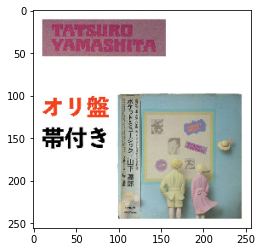

1/1 [==============================] - 0s 252ms/step
[[0.01027109 0.01113107 0.0437144  0.03249089 0.03222404 0.01863009
  0.02151535 0.00772827 0.01636853 0.00726263 0.04071011 0.03959301
  0.03201568 0.01229029 0.0322879  0.0437208  0.0227577  0.05034118
  0.03361052 0.04943971 0.02026264 0.04987548 0.00986986 0.02037635
  0.03232818 0.01085912 0.00895974 0.01466577 0.00899085 0.03494468
  0.03028653 0.02047857 0.02534541 0.03104713 0.04876211 0.02545557
  0.02659765 0.01494397 0.00784707]]
Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線 , 5.03
m54543532057.jpg: Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線
--------------------------------------------------------------
m88038628194.jpg


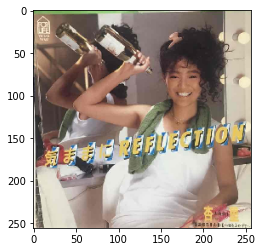

1/1 [==============================] - 0s 281ms/step
[[0.04432182 0.0099689  0.02231808 0.04133139 0.02058732 0.00553457
  0.0191477  0.00615918 0.01612585 0.00694062 0.03386838 0.03621201
  0.02611102 0.02147976 0.04110032 0.0473974  0.01773976 0.03871522
  0.04499866 0.0522295  0.02022316 0.04893022 0.00731268 0.01302935
  0.03065217 0.00813959 0.01079746 0.01908992 0.00365175 0.0222413
  0.02443367 0.02464695 0.03328208 0.02493873 0.07546952 0.02737971
  0.02046826 0.02330187 0.0097242 ]]
Tatsuro Yamashita - Softly , 7.55
m88038628194.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m85069650283.jpg


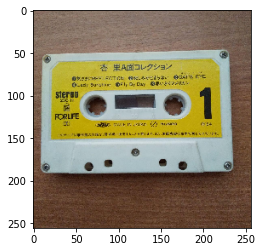

1/1 [==============================] - 0s 272ms/step
[[0.02109624 0.01360152 0.02988335 0.0418459  0.02519811 0.00616355
  0.01901616 0.00934987 0.02159492 0.0071921  0.04206268 0.03512101
  0.02074526 0.01096102 0.0258192  0.03453587 0.02242139 0.03508972
  0.04146305 0.0450535  0.02502144 0.0452521  0.01203987 0.02389378
  0.0566943  0.00868276 0.01173397 0.02268351 0.00756168 0.02150903
  0.01722136 0.02193171 0.04871145 0.01907533 0.06744141 0.0232017
  0.02542163 0.01906013 0.01464845]]
Tatsuro Yamashita - Softly , 6.74
m85069650283.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m51852063352.jpg


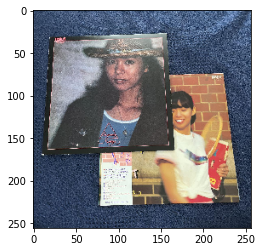

1/1 [==============================] - 0s 293ms/step
[[0.01730435 0.0141192  0.03332368 0.04774576 0.02791004 0.00620538
  0.01854471 0.0072907  0.01814753 0.00726323 0.05216894 0.02099494
  0.03590722 0.01309456 0.03661347 0.04310028 0.01662691 0.03290759
  0.04033204 0.03897618 0.01905809 0.0952379  0.00994902 0.02330431
  0.03476382 0.0118132  0.00754022 0.0153742  0.00485443 0.01617752
  0.02375684 0.02438373 0.05180093 0.022131   0.039301   0.01955987
  0.02203993 0.0225697  0.00780756]]
Taeko Ohnuki - Mignonne , 9.52
m51852063352.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m52637126854.jpg


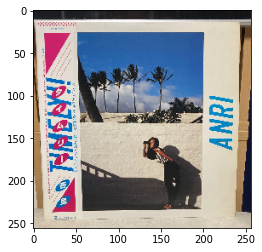

1/1 [==============================] - 0s 280ms/step
[[0.00886153 0.01093842 0.04672974 0.05291707 0.02635892 0.00770189
  0.00952422 0.00679027 0.01058416 0.00481737 0.05910437 0.06069294
  0.01919321 0.01262387 0.02885915 0.04499436 0.03093713 0.03918488
  0.03060562 0.08070681 0.01424078 0.04559239 0.01180592 0.01095197
  0.03977823 0.00798035 0.00961907 0.01281595 0.0061491  0.01275242
  0.02694025 0.01603056 0.03061642 0.01915272 0.06515168 0.0255988
  0.03072874 0.01433663 0.00763214]]
Taeko Ohnuki - Cliché , 8.07
m52637126854.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m39782839257.jpg


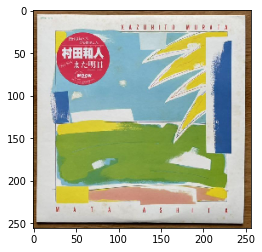

1/1 [==============================] - 0s 267ms/step
[[0.01088188 0.0118729  0.02900304 0.05662607 0.0351433  0.00897987
  0.02304762 0.00889429 0.01799097 0.00496392 0.03869598 0.04096655
  0.01543474 0.00866469 0.02839879 0.08158372 0.03546647 0.03570063
  0.03655885 0.04273892 0.02075569 0.04540053 0.00714791 0.01316603
  0.03327379 0.00714677 0.0063893  0.01547175 0.00914675 0.02617136
  0.04080806 0.01312287 0.03845902 0.01938649 0.05708737 0.02976936
  0.0215414  0.01343453 0.0107079 ]]
Momoko Kikuchi - Escape From Dimension , 8.16
m39782839257.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m30541527223.jpg


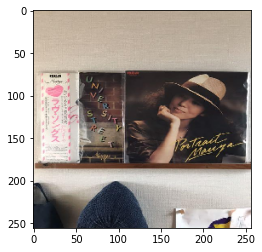

1/1 [==============================] - 0s 285ms/step
[[0.01725319 0.01235205 0.03374333 0.05541124 0.03182476 0.00661301
  0.02476768 0.00623836 0.01554709 0.00399103 0.04418444 0.0384094
  0.019888   0.01561634 0.06051746 0.05374901 0.01490335 0.02748524
  0.03963576 0.05545912 0.02064315 0.05874155 0.0084544  0.0128229
  0.02888106 0.00973213 0.0080161  0.00968281 0.0045166  0.01868001
  0.02101906 0.01669369 0.03672899 0.03347977 0.05510268 0.02380137
  0.03112855 0.01732369 0.00696161]]
Momoko Kikuchi - Adventure , 6.05
m30541527223.jpg: Momoko Kikuchi - Adventure
--------------------------------------------------------------
m95517704439.jpg


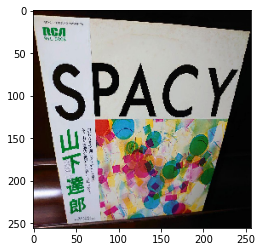

1/1 [==============================] - 0s 294ms/step
[[0.01510955 0.01149077 0.02743735 0.04376736 0.02788481 0.01313983
  0.02362147 0.01615831 0.01923065 0.00818755 0.04757299 0.02845347
  0.01613204 0.01621874 0.02175741 0.03587608 0.03440793 0.02359154
  0.02720376 0.06793642 0.01359353 0.03645068 0.00745962 0.01380668
  0.02627305 0.00492981 0.01127494 0.01613868 0.00621969 0.02476007
  0.01946454 0.01096982 0.05369991 0.02104684 0.10231625 0.0595472
  0.0125778  0.02299269 0.01130015]]
Tatsuro Yamashita - Softly , 10.23
m95517704439.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m54394001521.jpg


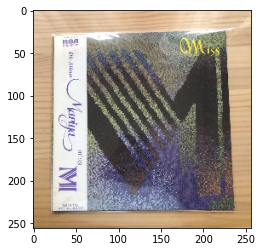

1/1 [==============================] - 0s 286ms/step
[[0.01431316 0.00918954 0.02144431 0.05342684 0.03390821 0.0107271
  0.01369282 0.00985026 0.03156291 0.006365   0.06494422 0.0630161
  0.0220203  0.01113722 0.02236089 0.03901435 0.02314162 0.03857823
  0.03485611 0.03482591 0.01232388 0.07208925 0.00779552 0.01398086
  0.03744626 0.0110237  0.00681683 0.0105998  0.00472163 0.0154547
  0.02522025 0.02115724 0.03305429 0.02700578 0.07638071 0.02105262
  0.01700324 0.01905352 0.00944477]]
Tatsuro Yamashita - Softly , 7.64
m54394001521.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m24756349373.jpg


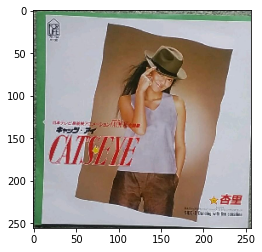

1/1 [==============================] - 0s 282ms/step
[[0.02538103 0.01186055 0.02739092 0.05479586 0.02279035 0.0071036
  0.0200108  0.00919845 0.02449412 0.00539219 0.04654655 0.02854578
  0.02213379 0.01357912 0.031794   0.0554389  0.02056915 0.02344961
  0.05909095 0.05240287 0.02823975 0.04427505 0.00850208 0.01412744
  0.04199293 0.00887625 0.0064953  0.02063834 0.00566092 0.01377481
  0.02038321 0.01787318 0.04112202 0.01902204 0.06836843 0.02789127
  0.02020715 0.02571589 0.00486532]]
Tatsuro Yamashita - Softly , 6.84
m24756349373.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m73714487725.jpg


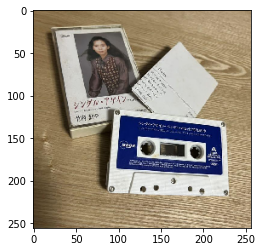

1/1 [==============================] - 0s 239ms/step
[[0.01525843 0.00987553 0.01929608 0.03027674 0.03386007 0.0068266
  0.02213452 0.01252333 0.01247047 0.00476202 0.06077659 0.02772662
  0.02482473 0.0160458  0.0512924  0.04089049 0.01754289 0.02660049
  0.03932341 0.03989099 0.01910201 0.08918263 0.01297609 0.02000358
  0.03140873 0.01060257 0.00531374 0.01101966 0.00571131 0.02499095
  0.02798653 0.03920574 0.04369988 0.02127382 0.05225562 0.01833234
  0.0243791  0.0200475  0.01031001]]
Taeko Ohnuki - Mignonne , 8.92
m73714487725.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m33330699667.jpg


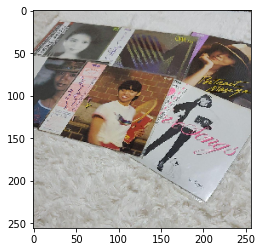

1/1 [==============================] - 0s 291ms/step
[[0.01864194 0.00920441 0.03588169 0.02860596 0.02977562 0.00827183
  0.0259502  0.00796156 0.01847322 0.00572046 0.04571374 0.02694962
  0.04026975 0.03245263 0.04132777 0.04795407 0.01568688 0.02953359
  0.03689079 0.04298894 0.01790586 0.03615337 0.01377472 0.02907338
  0.03836323 0.00982383 0.00944091 0.01367639 0.00801597 0.01496735
  0.02723161 0.02226863 0.04477844 0.0246345  0.04336233 0.02207187
  0.03816034 0.017865   0.02017761]]
Momoko Kikuchi - Escape From Dimension , 4.80
m33330699667.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m95201887356.jpg


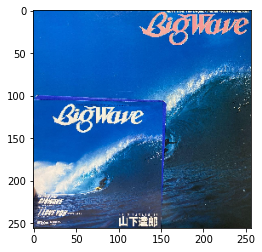

1/1 [==============================] - 0s 287ms/step
[[0.01277533 0.01416034 0.01601586 0.04749942 0.02245387 0.00800517
  0.02069196 0.00372034 0.0176342  0.00717783 0.04328493 0.04921265
  0.02624278 0.01028526 0.05751039 0.07763366 0.02838166 0.04891216
  0.04453129 0.0165961  0.01262388 0.05976858 0.0075313  0.01203288
  0.06318753 0.01519037 0.00656755 0.02012916 0.00725822 0.02033497
  0.02110459 0.01783786 0.03304131 0.02397045 0.04357776 0.01881281
  0.0202406  0.01485647 0.0092085 ]]
Momoko Kikuchi - Escape From Dimension , 7.76
m95201887356.jpg: Momoko Kikuchi - Escape From Dimension
--------------------------------------------------------------
m46335582812.jpg


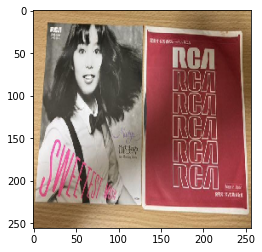

1/1 [==============================] - 0s 262ms/step
[[0.01194281 0.009452   0.0238513  0.03870065 0.02811891 0.00768576
  0.0175173  0.01101019 0.01730222 0.00465619 0.06769477 0.04579651
  0.02864859 0.0108709  0.04064097 0.06220723 0.02118728 0.02707448
  0.03752489 0.03212028 0.01731846 0.07144143 0.00869743 0.02086812
  0.02561652 0.00840069 0.0036195  0.01107945 0.0052837  0.02318907
  0.02975752 0.01785185 0.03618049 0.02723175 0.07283645 0.03063236
  0.02068451 0.01715373 0.00815373]]
Tatsuro Yamashita - Softly , 7.28
m46335582812.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m96466080135.jpg


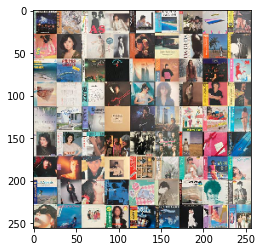

1/1 [==============================] - 0s 262ms/step
[[0.01794393 0.01530574 0.03195767 0.03998709 0.02494696 0.00568894
  0.01178139 0.00995366 0.01469179 0.00698105 0.07507777 0.03679376
  0.02075315 0.02174333 0.03349174 0.0421533  0.02173344 0.02334274
  0.01941263 0.0881883  0.00867405 0.03987109 0.00564295 0.01204087
  0.02379352 0.00804344 0.01903201 0.01545718 0.0074803  0.01600591
  0.02317324 0.0326578  0.06373869 0.02451528 0.02780178 0.04416949
  0.0352597  0.01933114 0.01138315]]
Taeko Ohnuki - Cliché , 8.82
m96466080135.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m17055471771.jpg


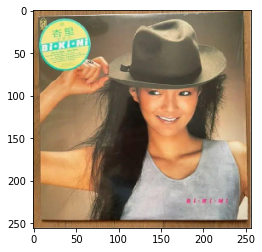

1/1 [==============================] - 0s 268ms/step
[[0.0696867  0.02030619 0.01739462 0.02756053 0.024965   0.01101403
  0.03212932 0.00682653 0.02355997 0.00544573 0.03602357 0.03550201
  0.02452863 0.01533712 0.03484204 0.05012518 0.0204763  0.0171876
  0.03112159 0.03253978 0.01371618 0.04064049 0.006934   0.04114559
  0.02446475 0.00648909 0.00710285 0.02221809 0.00684325 0.02260536
  0.02642449 0.01570837 0.04434902 0.01067274 0.07076856 0.02792965
  0.02471249 0.02863136 0.02207125]]
Tatsuro Yamashita - Softly , 7.08
m17055471771.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m11517590720.jpg


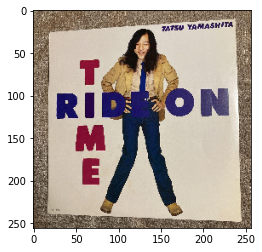

1/1 [==============================] - 0s 308ms/step
[[0.01627079 0.01098548 0.03338717 0.04986944 0.02143421 0.00755125
  0.02430392 0.00847395 0.02690136 0.01139513 0.03426787 0.04841181
  0.017807   0.01194378 0.02328071 0.02607796 0.01463836 0.02154911
  0.03011234 0.07262702 0.02142258 0.06877851 0.00789864 0.01333602
  0.02358012 0.0066625  0.00907498 0.01171549 0.0049837  0.02222187
  0.03356435 0.01861604 0.03852757 0.02073746 0.1117771  0.02185742
  0.02073392 0.02679604 0.00642701]]
Tatsuro Yamashita - Softly , 11.18
m11517590720.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m12613888736.jpg


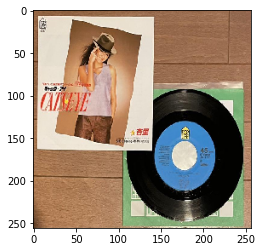

1/1 [==============================] - 0s 284ms/step
[[0.01542633 0.0162122  0.03898466 0.04030302 0.02356108 0.01094655
  0.05543013 0.00499637 0.0126542  0.00686242 0.05072097 0.03730376
  0.03441372 0.02447836 0.04472617 0.02949606 0.01679746 0.05976233
  0.02428129 0.02345796 0.02428477 0.03689533 0.00774091 0.02758605
  0.02810069 0.01130591 0.01085208 0.02228073 0.01145436 0.02770987
  0.03224453 0.01797882 0.01736686 0.0178987  0.04597032 0.0206993
  0.03613113 0.02121886 0.01146578]]
Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線 , 5.98
m12613888736.jpg: Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線
--------------------------------------------------------------
m51507727079.jpg


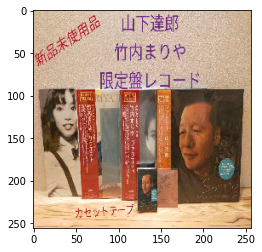

1/1 [==============================] - 0s 295ms/step
[[0.01445551 0.01750273 0.02629685 0.04695728 0.02756217 0.01362628
  0.01514533 0.00644391 0.01605208 0.00672429 0.0677809  0.03845382
  0.03002891 0.01223535 0.05054939 0.02489684 0.02659403 0.02583669
  0.03625492 0.03587206 0.01837733 0.0381947  0.00893834 0.02016556
  0.03439354 0.00929041 0.00965284 0.01354392 0.01172819 0.02515488
  0.02544995 0.01855964 0.04373612 0.02387859 0.06074849 0.04189275
  0.02378115 0.02094447 0.01229967]]
Mariya Takeuchi - Miss M , 6.78
m51507727079.jpg: Mariya Takeuchi - Miss M
--------------------------------------------------------------
m95625025814.jpg


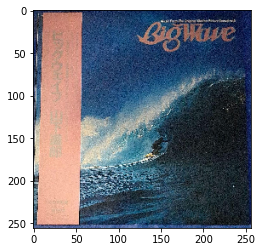

1/1 [==============================] - 0s 284ms/step
[[0.02293139 0.0154986  0.015311   0.04297113 0.03002232 0.00919354
  0.0226634  0.00543603 0.01934825 0.00564971 0.0545004  0.04260292
  0.02965018 0.01080153 0.05151351 0.04999247 0.02844346 0.03388721
  0.03041447 0.02227392 0.00992716 0.06179066 0.00652216 0.01886708
  0.05130701 0.00788106 0.00642786 0.01928803 0.00631358 0.01919175
  0.01697559 0.02781811 0.04331471 0.02081238 0.06260099 0.01990436
  0.02273434 0.02389857 0.01131916]]
Tatsuro Yamashita - Softly , 6.26
m95625025814.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m93923434809.jpg


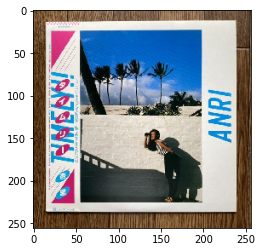

1/1 [==============================] - 0s 265ms/step
[[0.00993879 0.00961998 0.07039092 0.05473069 0.02409426 0.00812146
  0.01448947 0.00797262 0.01185378 0.00459577 0.06909185 0.05501783
  0.02508426 0.01121714 0.02912609 0.03374513 0.02189251 0.04245287
  0.02753364 0.06289849 0.01600504 0.03746664 0.00995758 0.01165657
  0.04004205 0.00791906 0.01123297 0.01292902 0.00826892 0.01591872
  0.03432399 0.01549055 0.02103992 0.02286634 0.06659701 0.02545922
  0.02845383 0.01088114 0.00962378]]
Anri (2) - Timely!! , 7.04
m93923434809.jpg: Anri (2) - Timely!!
--------------------------------------------------------------
m64277008416.jpg


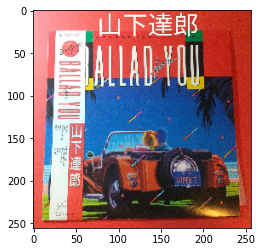

1/1 [==============================] - 0s 233ms/step
[[0.0137283  0.01520816 0.02457858 0.04449368 0.02604274 0.00586712
  0.01723902 0.01159528 0.01732656 0.00704189 0.0334553  0.06096609
  0.01259651 0.01624988 0.02822787 0.03414562 0.02860928 0.04629217
  0.03775894 0.07003427 0.01649942 0.04587857 0.00810668 0.00790443
  0.04676856 0.00592395 0.01222535 0.01678814 0.00870318 0.02786317
  0.01462433 0.02804496 0.06305755 0.02187228 0.05359501 0.03361469
  0.01634886 0.01553092 0.00519267]]
Taeko Ohnuki - Cliché , 7.00
m64277008416.jpg: Taeko Ohnuki - Cliché
--------------------------------------------------------------
m54169379779.jpg


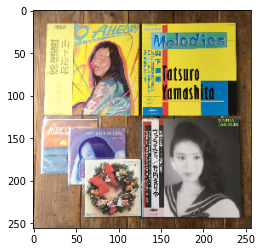

1/1 [==============================] - 0s 298ms/step
[[0.01154643 0.01199525 0.04174733 0.03590368 0.02896244 0.01281972
  0.03300555 0.00874399 0.01174902 0.00646351 0.0401779  0.03553784
  0.02202283 0.00836514 0.04806096 0.04035494 0.01479284 0.04911441
  0.04833733 0.03743251 0.02039594 0.03244425 0.00939398 0.01930738
  0.02754677 0.00972993 0.00474487 0.01844907 0.00921879 0.01961459
  0.02697634 0.01620135 0.03104468 0.01621811 0.08446811 0.03834462
  0.0401941  0.02065523 0.00791822]]
Tatsuro Yamashita - Softly , 8.45
m54169379779.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m27084446199.jpg


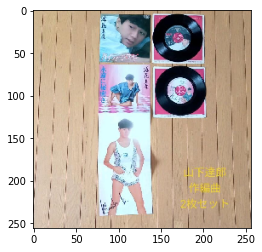

1/1 [==============================] - 0s 256ms/step
[[0.0148897  0.01134799 0.02956807 0.03775122 0.02183317 0.0138651
  0.02875623 0.00859503 0.01897929 0.00663635 0.06185927 0.0346151
  0.02659644 0.0124381  0.02726454 0.0279972  0.01471012 0.04396339
  0.02320304 0.03706718 0.01717467 0.05312261 0.00398198 0.0264825
  0.01959161 0.00836495 0.01054442 0.01146556 0.0089788  0.02486609
  0.02563806 0.0183815  0.06598078 0.02307495 0.07803665 0.02595581
  0.03583961 0.01566408 0.02491882]]
Tatsuro Yamashita - Softly , 7.80
m27084446199.jpg: Tatsuro Yamashita - Softly
--------------------------------------------------------------
m36550320623.jpg


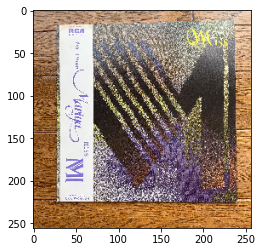

1/1 [==============================] - 0s 294ms/step
[[0.01390276 0.00849371 0.01959352 0.04903165 0.02558394 0.00959818
  0.01228276 0.00887111 0.03553921 0.00451128 0.07521593 0.05418512
  0.02332025 0.01103822 0.02404488 0.0381926  0.02496822 0.02811972
  0.03618114 0.02938818 0.00921736 0.08868381 0.00574577 0.01786331
  0.03340339 0.00923649 0.0042529  0.01144293 0.00349638 0.01854844
  0.01851232 0.02330161 0.06642704 0.02342674 0.08146284 0.01600157
  0.01178039 0.01719138 0.00794296]]
Taeko Ohnuki - Mignonne , 8.87
m36550320623.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m53373119541.jpg


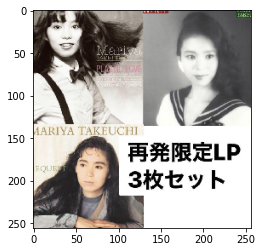

1/1 [==============================] - 0s 347ms/step
[[0.0221227  0.01519981 0.0206344  0.03096719 0.03168768 0.00725738
  0.01415762 0.00709402 0.01889003 0.00776681 0.06650879 0.0530315
  0.0204188  0.01963333 0.04594658 0.07427898 0.01288944 0.02072485
  0.03337812 0.03477844 0.01233616 0.08216514 0.00816643 0.0247601
  0.02835347 0.00930145 0.00340004 0.01304558 0.00603357 0.01715664
  0.02047582 0.02101248 0.01953906 0.0232614  0.04062578 0.04521084
  0.02925007 0.02628513 0.01225438]]
Taeko Ohnuki - Mignonne , 8.22
m53373119541.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m56617323587.jpg


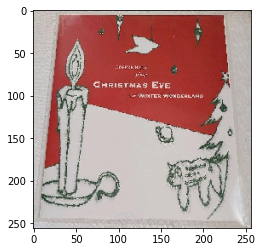

1/1 [==============================] - 0s 269ms/step
[[0.01521104 0.01645047 0.02679904 0.02667489 0.04715736 0.00732259
  0.01706859 0.0062255  0.01308362 0.00898325 0.04266328 0.06186968
  0.01670776 0.02008307 0.0278701  0.05508148 0.03096917 0.03969245
  0.02492293 0.04137796 0.01632577 0.07637715 0.01473284 0.01438575
  0.03100663 0.01100102 0.00641877 0.02024743 0.00836836 0.01856944
  0.02148643 0.01658683 0.04046077 0.02792112 0.05218584 0.02720507
  0.02357504 0.018473   0.00845851]]
Taeko Ohnuki - Mignonne , 7.64
m56617323587.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m82850227746.jpg


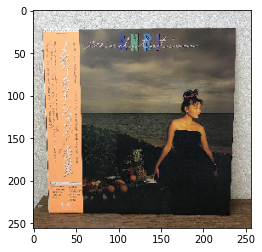

1/1 [==============================] - 0s 342ms/step
[[0.01571715 0.01291784 0.01941275 0.05357027 0.03762349 0.00671383
  0.01891402 0.00748328 0.01491788 0.00619823 0.06255724 0.04702989
  0.02417745 0.01421623 0.04300867 0.04637191 0.02429375 0.03734935
  0.03148775 0.029747   0.01853195 0.07688271 0.00713362 0.01413579
  0.03694664 0.00857571 0.00616133 0.01185804 0.00727976 0.01647429
  0.01588041 0.01890424 0.03810994 0.02312027 0.06470602 0.03073389
  0.02018728 0.02173013 0.0089399 ]]
Taeko Ohnuki - Mignonne , 7.69
m82850227746.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------
m75247892580.jpg


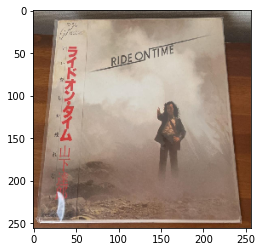

1/1 [==============================] - 0s 284ms/step
[[0.01356528 0.00799714 0.01940499 0.04376915 0.03111026 0.00778303
  0.01756595 0.00565368 0.02006699 0.0060728  0.04945558 0.03933134
  0.03041979 0.01607995 0.03325803 0.04959028 0.03383623 0.05172222
  0.03004058 0.030521   0.0169182  0.08247688 0.00476875 0.01539579
  0.04119265 0.00578316 0.00671531 0.01200632 0.00501385 0.02049117
  0.02249998 0.01731334 0.03303538 0.04969993 0.06259    0.03107581
  0.01340199 0.01297327 0.00940388]]
Taeko Ohnuki - Mignonne , 8.25
m75247892580.jpg: Taeko Ohnuki - Mignonne
--------------------------------------------------------------


In [56]:
mypath = "./raw_data/Test_CNN/"

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
print(onlyfiles)

# predicting images
for file in onlyfiles:
    print(file)
    img = image.load_img(mypath+file, target_size=(img_width, img_height)) #150x150
    
    imgplot = plt.imshow(img)
    plt.show()
    
    x = image.img_to_array(img)
    x /= 255.0
    x = np.expand_dims(x, axis=0)
    
    images = np.vstack([x])
    classes = model.predict(images)
    #classes = model.predict_classes(images)
    print(classes)
    #classes = classes[0][0]
    
#     if np.argmax(classes)*100 <= 0.07:
#         print("%s , %.2f" % ("Cannot define", (classes[0][np.argmax(classes)]*100)))
#         print(file + ": " + 'Cannot define')

#     if classes[0][np.argmax(classes)]*100 <= 70:
#         print("%s , %.2f" % ("Cannot define", (classes[0][np.argmax(classes)]*100)))
#         print(file + ": " + 'Cannot define')
    if np.argmax(classes) == 0:
        print("%s , %.2f" % ("Anri (2) - Bi・Ki・Ni", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Bi・Ki・Ni')
    elif np.argmax(classes) == 1:
        print("%s , %.2f" % ("Anri (2) - Coool", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Coool')
    elif np.argmax(classes) == 2:
        print("%s , %.2f" % ("Anri (2) - Timely!!", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Timely!!')
    elif np.argmax(classes) == 3:
        print("%s , %.2f" % ("Anri (2) - Wave", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Wave')
    elif np.argmax(classes) == 4:
        print("%s , %.2f" % ("Hiroshi Sato - Aqua", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Aqua')
    elif np.argmax(classes) == 5:
        print("%s , %.2f" % ("Hiroshi Sato - Awakening", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Awakening')
    elif np.argmax(classes) == 6:
        print("%s , %.2f" % ("Hiroshi Sato - Future File", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Future File')
    elif np.argmax(classes) == 7:
        print("%s , %.2f" % ("Hiroshi Sato - Sound Of Science", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Sound Of Science')
    elif np.argmax(classes) == 8:
        print("%s , %.2f" % ("Mariya Takeuchi - Beginning", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Beginning')
    elif np.argmax(classes) == 9:
        print("%s , %.2f" % ("Mariya Takeuchi - Love Songs", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Love Songs')
    elif np.argmax(classes) == 10:
        print("%s , %.2f" % ("Mariya Takeuchi - Miss M", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Miss M')
    elif np.argmax(classes) == 11:
        print("%s , %.2f" % ("Mariya Takeuchi - Request", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Request')
    elif np.argmax(classes) == 12:
        print("%s , %.2f" % ("Mariya Takeuchi - Trad = トラッド", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Trad = トラッド')
    elif np.argmax(classes) == 13:
        print("%s , %.2f" % ("Mariya Takeuchi - University Street", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - University Street')
    elif np.argmax(classes) == 14:
        print("%s , %.2f" % ("Momoko Kikuchi - Adventure", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Adventure')
    elif np.argmax(classes) == 15:
        print("%s , %.2f" % ("Momoko Kikuchi - Escape From Dimension", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Escape From Dimension')
    elif np.argmax(classes) == 16:
        print("%s , %.2f" % ("Momoko Kikuchi - Ocean Side", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Ocean Side')
    elif np.argmax(classes) == 17:
        print("%s , %.2f" % ("Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線')
    elif np.argmax(classes) == 18:
        print("%s , %.2f" % ("Taeko Ohnuki - Aventure", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Aventure')
    elif np.argmax(classes) == 19:
        print("%s , %.2f" % ("Taeko Ohnuki - Cliché", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Cliché')
    elif np.argmax(classes) == 20:
        print("%s , %.2f" % ("Taeko Ohnuki - Grey Skies", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Grey Skies')
    elif np.argmax(classes) == 21:
        print("%s , %.2f" % ("Taeko Ohnuki - Mignonne", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Mignonne')
    elif np.argmax(classes) == 22:
        print("%s , %.2f" % ("Taeko Ohnuki - Romantique", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Romantique')
    elif np.argmax(classes) == 23:
        print("%s , %.2f" % ("Taeko Ohnuki - Sunshower", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Sunshower')
    elif np.argmax(classes) == 24:
        print("%s , %.2f" % ("Tatsuro Yamashita - Big Wave = ビッグウェイブ", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Big Wave = ビッグウェイブ')
    elif np.argmax(classes) == 25:
        print("%s , %.2f" % ("Tatsuro Yamashita - Circus Town", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Circus Town')
    elif np.argmax(classes) == 26:
        print("%s , %.2f" % ("Tatsuro Yamashita - For You", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - For You')
    elif np.argmax(classes) == 27:
        print("%s , %.2f" % ("Tatsuro Yamashita - Go Ahead!", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Go Ahead!')
    elif np.argmax(classes) == 28:
        print("%s , %.2f" % ("Tatsuro Yamashita - It's A Poppin' Time", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + "Tatsuro Yamashita - It's A Poppin' Time")
    elif np.argmax(classes) == 29:
        print("%s , %.2f" % ("Tatsuro Yamashita - Melodies", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Melodies')
    elif np.argmax(classes) == 30:
        print("%s , %.2f" % ("Tatsuro Yamashita - Moonglow", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Moonglow')
    elif np.argmax(classes) == 31:
        print("%s , %.2f" % ("Tatsuro Yamashita - On The Street Corner", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - On The Street Corner')
    elif np.argmax(classes) == 32:
        print("%s , %.2f" % ("Tatsuro Yamashita - On The Street Corner 2", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - On The Street Corner 2')
    elif np.argmax(classes) == 33:
        print("%s , %.2f" % ("Tatsuro Yamashita - Ride On Time", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Ride On Time')
    elif np.argmax(classes) == 34:
        print("%s , %.2f" % ("Tatsuro Yamashita - Softly", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Softly')
    elif np.argmax(classes) == 35:
        print("%s , %.2f" % ("Tatsuro Yamashita - Spacy", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Spacy')
    elif np.argmax(classes) == 36:
        print("%s , %.2f" % ("Utada Hikaru - Badモード", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Utada Hikaru - Badモード')
    elif np.argmax(classes) == 37:
        print("%s , %.2f" % ("Utada Hikaru - Deep River", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Utada Hikaru - Deep River')
    elif np.argmax(classes) == 38:
        print("%s , %.2f" % ("Utada Hikaru - First Love", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Utada Hikaru - First Love')
    elif np.argmax(classes) == 39:
        print("%s , %.2f" % ("Various - Classic Jazz-Funk Mastercuts Volume 7", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Various - Classic Jazz-Funk Mastercuts Volume 7')
    elif np.argmax(classes) == 40:
        print("%s , %.2f" % ("東北新幹線 - Thru Traffic", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + '東北新幹線 - Thru Traffic')
        
    print('--------------------------------------------------------------')